Problem Statement:
Computer vision can be used in health care for identifying diseases. In Pneumonia detection we need to detect Inflammation of  the  lungs.  In  this  challenge,  you’re  required  to  build  an  algorithm  to  detect  a  visual  signal  for  pneumonia  in  medical images. Specifically, your algorithm needs to automatically locate lung opacities on chest radiographs.

DATA DESCRIPTION:- In the dataset, some of the features are labeled “Not Normal No Lung Opacity”. This extra third class indicates that while pneumonia was determined not to be present, there was nonetheless some type of abnormality on the image and oftentimes this finding may mimic the appearance of true pneumonia. Dicom original images: - Medical images are stored in a special format called DICOM files (*.dcm). They contain a combination of header metadata as well as underlying raw image arrays for pixel data. - Dataset has been attached along with this project.

PROJECT OBJECTIVE: Design a DL based algorithm for detecting pneumonia.

PROJECT TASK:
‣Input: Context and Dataset‣Process:
- ‣Step 1: Import the data.
- ‣Step 2: Map training and testing images to its classes.
- ‣Step 3: Map training and testing images to its annotations.
- ‣Step 4: Preprocessing and Visualisation of different classes
- ‣Step 5: Display images with bounding box.
- ‣Step 6: Design, train and test basic CNN models for classification.
- ‣Step 7: Interim report
- ‣Submission: Interim report,




In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
!pip install opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.0/63.0 MB 20.6 MB/s eta 0:00:00


In [5]:
!pip install tensorflow
!pip install pydicom

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.9/644.9 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 81.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 116.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 97.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 114.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 18.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.5/72.5 kB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 23.4 MB/s eta 0:00:00


In [6]:
%%time

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import cv2, os, random
import plotly
import plotly.graph_objs as go
import plotly.express as px
from plotly.offline import init_notebook_mode, plot, iplot
import seaborn as sns


CPU times: user 10.6 s, sys: 2.09 s, total: 12.6 s
Wall time: 15.8 s


In [7]:
!pip install mlxtend

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 15.2 MB/s eta 0:00:00


In [8]:
import glob
import tensorflow
from tensorflow.keras.preprocessing.image import array_to_img, img_to_array, load_img
from tensorflow.keras.layers import Conv2D, Flatten, MaxPooling2D, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential
from mlxtend.plotting import plot_confusion_matrix
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.applications.vgg16 import VGG16
from sklearn.model_selection import train_test_split

In [9]:
!pip install albumentations

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.1/43.1 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.3/80.3 kB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.5/66.5 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 369.4/369.4 kB 14.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.0/50.0 MB 27.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 49.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.8/307.8 kB 23.1 MB/s eta 0:00:00


In [10]:
from tqdm.notebook import tqdm
from termcolor import colored
import albumentations as A

In [11]:
from warnings import filterwarnings
filterwarnings("ignore")

from sklearn import set_config
set_config(print_changed_only = False)
directory = "/content/drive/MyDrive/Python Course/Capstone/"
print(colored("Required libraries were succesfully imported...", color = "green", attrs = ["bold", "dark"]))

Required libraries were succesfully imported...


In [12]:
print("Current tensorflow version == {}".format(tensorflow. __version__))

Current tensorflow version == 2.19.0


In [13]:
# Check if the file exists
file_path = os.path.join(directory, 'stage_2_detailed_class_info.csv')
if os.path.exists(file_path):
  # Load the datasets if the file exists
  class_info_df = pd.read_csv(file_path)
  train_df = pd.read_csv(os.path.join(directory, 'stage_2_train_labels.csv'))
  print(colored("The datasets were successfully loaded...", color="green", attrs=["bold", "dark"]))
else:
  print(colored(f"Error: File not found at {file_path}", color="red", attrs=["bold", "dark"]))

The datasets were successfully loaded...


In [14]:
print(f"Train labels -  rows: {train_df.shape[0]}, columns: {train_df.shape[1]}")

Train labels -  rows: 30227, columns: 6


In [15]:
###Let's explore the two loaded files. We will take out a 5 rows samples from each dataset.
class_info_df.sample(10)



,patientId,class
6911,52a85d13-7aee-4236-a9a5-16d9a58ad4b5,No Lung Opacity / Not Normal
6912,52a954f4-7d46-4088-b646-7b3e5d85e8d6,No Lung Opacity / Not Normal
16478,9f64795e-f4ca-4931-ac92-f5a41b292227,No Lung Opacity / Not Normal
6178,4cc9c4ad-ad87-4b32-8047-c2e375a2e820,No Lung Opacity / Not Normal
10055,6c27f72e-7cda-4e4b-906d-ec6b84cee49e,No Lung Opacity / Not Normal
28896,ff42dbdc-285e-457d-aa3d-725638fa083b,Normal
9321,667eca17-25d0-4d29-ba3c-6e4f5cf5f9b0,No Lung Opacity / Not Normal
28517,fc507735-7738-420e-9da3-8d36f6e19633,Normal
12813,81d9d146-e9bb-478b-aeed-c2431780030e,Lung Opacity
17327,a5d3551e-12f8-478c-84b2-6bc609c03ed3,No Lung Opacity / Not Normal


In [16]:
train_df.sample(10)

,patientId,x,y,width,height,Target
10069,6c490407-f039-4eaf-94c8-1bff41b09f6c,697.0,627.0,141.0,175.0,1
10205,6d462751-b97f-48a1-b09c-192c5e114825,191.0,290.0,235.0,282.0,1
4633,40346c30-cf4a-4fe3-a6a1-935ac182a551,269.0,301.0,130.0,193.0,1
29816,268e70e8-ae02-4926-90fb-f458452c53d2,NaN,NaN,NaN,NaN,0
16865,a274e211-1819-4d85-91d9-e2a6ffad9180,NaN,NaN,NaN,NaN,0
11849,7a1e02f8-4965-4364-918b-83d3422f931b,632.0,489.0,144.0,260.0,1
24776,de8339e8-3f7d-43af-9ca5-9c783d6642db,221.0,426.0,206.0,221.0,1
3192,36c82e78-4a3f-45f0-94c1-27357fc79aa7,NaN,NaN,NaN,NaN,0
21292,c236f38d-10dd-4f33-bbe9-c849c297806f,614.0,260.0,221.0,540.0,1
3683,39fd4e64-28de-4424-9772-73d337cffad1,NaN,NaN,NaN,NaN,0


Observations:
- Classs Info set contains detailed information about the type of positive or negative class associated with a certain patient.

- The train dataset contains the patient ID and the window (x min, y min, width and height of the) containing evidence of pneumonia.

###Data Exploration

In [17]:
# Lets check the missing data
def missing_data(data):
    total = data.isnull().sum().sort_values(ascending = False)
    percent = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = False)
    return np.transpose(pd.concat([total, percent], axis=1, keys=['Total', 'Percent']))
missing_data(train_df)

,x,y,height,width,patientId,Target
Total,20672.000000,20672.000000,20672.000000,20672.000000,0.0,0.0
Percent,68.389188,68.389188,68.389188,68.389188,0.0,0.0


In [18]:
missing_data(class_info_df)

,patientId,class
Total,0.0,0.0
Percent,0.0,0.0


Observation:
The percent missing for x,y, height and width in train dataset represents the percent of the target 0 (not Lung opacity).

####Let's check the class distribution from class detailed info.

Text(0.5, 1.0, 'Class Distribution')

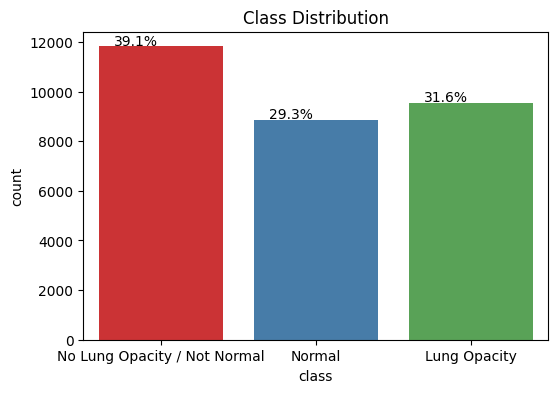

In [19]:
#Let's check the class distribution from class detailed info with percentage
f, ax = plt.subplots(1,1, figsize=(6,4))
ax = sns.countplot(x=class_info_df['class'], data=class_info_df, palette='Set1')
for p in ax.patches:
    ax.annotate('{:.1f}%'.format(100*p.get_height()/len(class_info_df)), (p.get_x()+0.1, p.get_height()+50))
plt.title('Class Distribution')

In [20]:
def get_feature_distribution(data, feature):
    # Get the count for each label
    label_counts = data[feature].value_counts()

    # Get total number of samples
    total_samples = len(data)

    # Count the number of items in each class
    print("Feature: {}".format(feature))
    for i in range(len(label_counts)):
        label = label_counts.index[i]
        count = label_counts.values[i]
        percent = int((count / total_samples) * 10000) / 100
        print("{:<30s}:   {} or {}%".format(label, count, percent))

get_feature_distribution(class_info_df, 'class')

Feature: class
No Lung Opacity / Not Normal  :   11821 or 39.1%
Lung Opacity                  :   9555 or 31.61%
Normal                        :   8851 or 29.28%


Observations:
No Lung Opacity / Not Normal and Normal have together the same percent (69%) as the percent of missing values for target window in class details information.

In the train set, the percent of data with value for Target = 1 is therefore 31%.

####Merge train and class detail info data


In [21]:
#Let's merge now the two datasets, using Patient ID as the merge criteria
train_df = pd.merge(train_df, class_info_df, on='patientId', how='left')
train_df.head()

,patientId,x,y,width,height,Target,class
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0,Normal
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,Lung Opacity


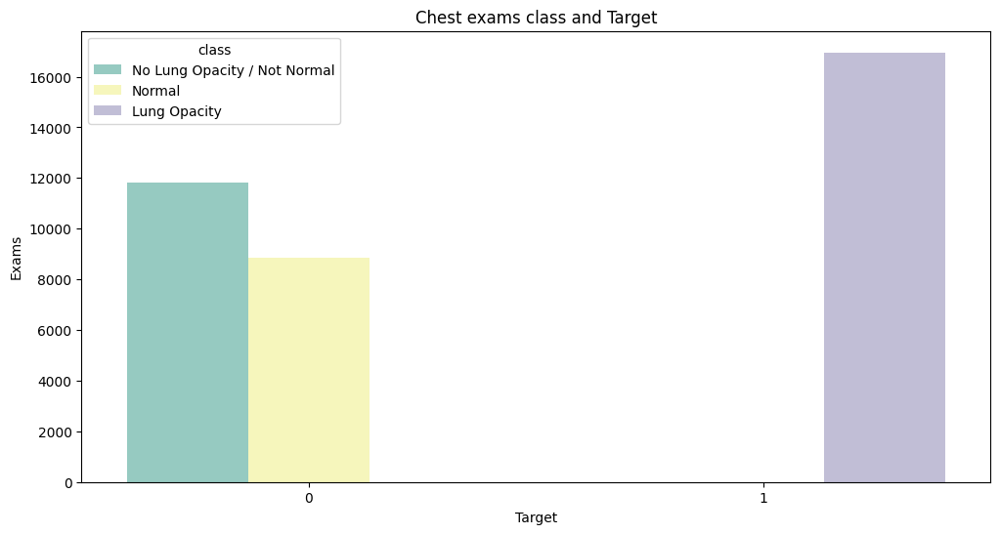

In [22]:
#Let's plot the number of examinations for each class detected, grouped by Target value.
fig, ax = plt.subplots(nrows=1,figsize=(12,6))
tmp = train_df.groupby('Target')['class'].value_counts()
df = pd.DataFrame(data={'Exams': tmp.values}, index=tmp.index).reset_index()
sns.barplot(ax=ax,x = 'Target', y='Exams',hue='class',data=df, palette='Set3')
plt.title("Chest exams class and Target")
plt.show()


Observations:
- Target = 1 (pathology detected) associated with class: Lung Opacity.
- Target = 0 (no pathology detected) are either of class: Normal or class: No Lung Opacity / Not Normal.

####Detected Lung Opacity window

####For the class **Lung Opacity**, corresponding to values of **Target = 1**, we plot the density of **x**, **y**, **width** and **height**.

<Figure size 640x480 with 0 Axes>

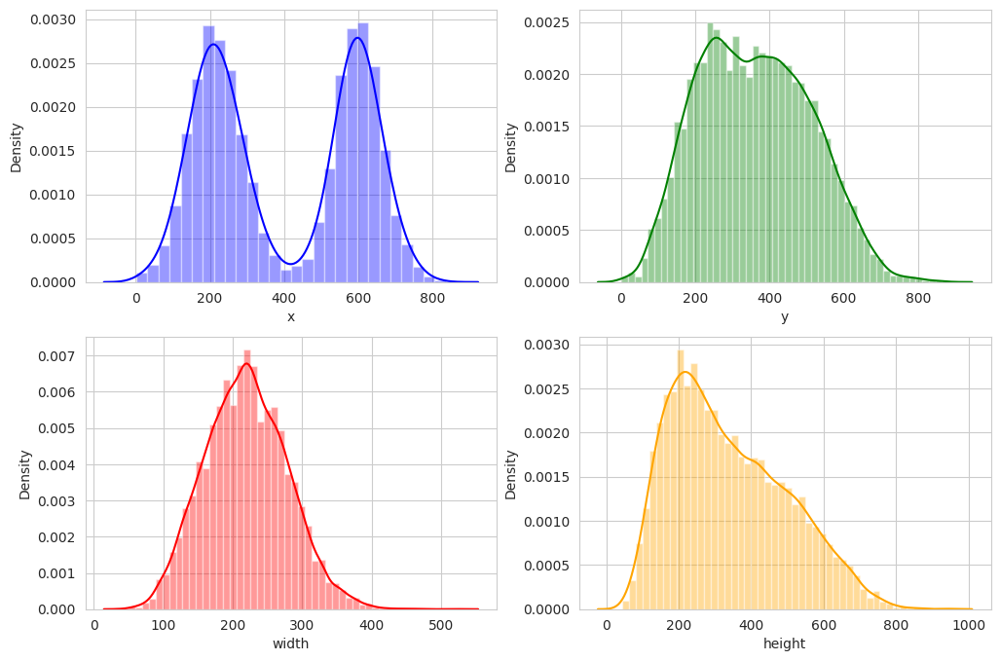

In [23]:
#For the class Lung Opacity, corresponding to values of Target = 1, we plot the density of x, y, width and height.
target1 = train_df[train_df['Target']==1]
sns.set_style('whitegrid')
plt.figure()
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8))
sns.distplot(train_df[train_df['Target'] == 1]['x'], color= "blue", ax=axes[0][0])
sns.distplot(train_df[train_df['Target'] == 1]['y'], color= "green",ax=axes[0][1])
sns.distplot(train_df[train_df['Target'] == 1]['width'], color= "red",ax=axes[1][0])
sns.distplot(train_df[train_df['Target'] == 1]['height'], color= "orange",ax=axes[1][1])
plt.show()

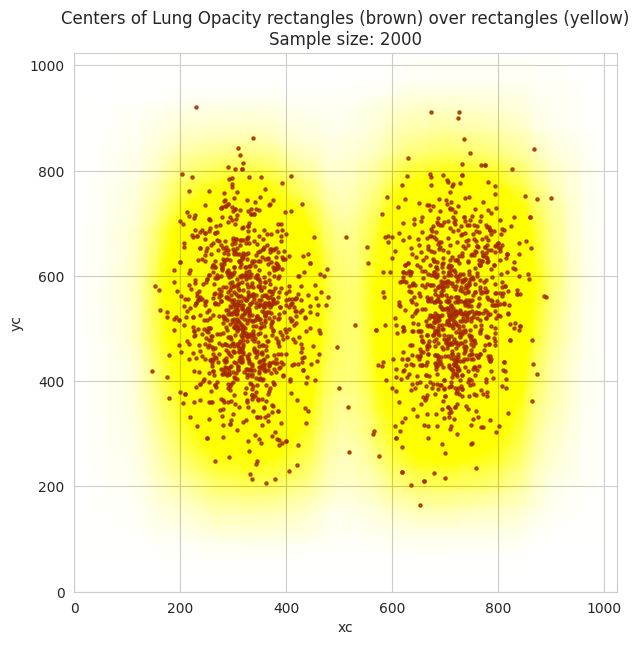

In [24]:
# Lets plot the center of the rectangles points in the plane x0y. The centers of the rectangles are the points. The rectangles are created using the method described in Kevin's Kernel
from matplotlib.patches import Rectangle
fig, ax = plt.subplots(1,1,figsize=(7,7))
target_sample = target1.sample(2000)
target_sample['xc'] = target_sample['x'] + target_sample['width'] / 2
target_sample['yc'] = target_sample['y'] + target_sample['height'] / 2
plt.title("Centers of Lung Opacity rectangles (brown) over rectangles (yellow)\nSample size: 2000")
target_sample.plot.scatter(x='xc', y='yc', xlim=(0,1024), ylim=(0,1024), ax=ax, alpha=0.8, marker=".", color="brown")
for i, crt_sample in target_sample.iterrows():
    ax.add_patch(Rectangle(xy=(crt_sample['x'], crt_sample['y']),
                width=crt_sample['width'],height=crt_sample['height'],alpha=3.5e-3, color="yellow"))
plt.show()

#### Explore DICOM data

In [25]:
#!pip install pydicom # install the pydicom library
#Let's read now the DICOM data in the train set having zip file
import pydicom # import the pydicom library
from pydicom.pixel_data_handlers import convert_color_space



In [ ]:
# SINCE ALREADY EXTRACTED THE .dcm IMAGE FILES FROM .ZIP FILE, NOT RUNNING IT NOW
#Let's read now the DICOM data from stage_2_train_images.zip and stage_2_test_images.zip from drive
train_zip_path = '/content/drive/MyDrive/Python Course/Capstone/stage_2_train_images.zip'
train_images_path = '/content/drive/MyDrive/Python Course/Capstone/stage_2_train_images/'
#test_images_path = os.path.join(directory, "stage_2_test_images.zip")

#Extract the zip files
import zipfile

with zipfile.ZipFile(train_zip_path, 'r') as zip_ref:
    zip_ref.extractall(train_images_path)
#with zipfile.ZipFile(test_images_path, 'r') as zip_ref:
 #   zip_ref.extractall(directory)

In [26]:
# Update paths to the extracted directories using os.path.join
train_images_path = '/content/drive/MyDrive/Python Course/Capstone/stage_2_train_images/'
#test_images_path = os.path.join(directory, "stage_2_test_images")

# Lets print the numer of images
print("Number of train images: {}".format(len(os.listdir(os.path.abspath(train_images_path)))))
#print("Number of test images: {}".format(len(os.listdir(os.path.abspath(test_images_path)))))

Number of train images: 26684


In [27]:
#Lets check for duplicates
train_images_ids = [os.path.splitext(file)[0] for file in os.listdir(os.path.abspath(train_images_path))]
#test_images_ids = [os.path.splitext(file)[0] for file in os.listdir(os.path.abspath(test_images_path))]
print("Number of train images ids: {}".format(len(train_images_ids)))
#print("Number of test images ids: {}".format(len(test_images_ids)))

Number of train images ids: 26684


In [28]:
#Let's see what entries are duplicated. We want to check how are these distributed accross classes and Target value.
tmp = train_df.groupby(['patientId','Target', 'class'])['patientId'].count()
df = pd.DataFrame(data={'Exams': tmp.values}, index=tmp.index).reset_index()
# Rename the 'class' column to 'Class' to match the column name in df
df = df.rename(columns={'class': 'Class'})
tmp = df.groupby(['Exams','Target','Class']).count()
df2 = pd.DataFrame(data=tmp.values, index=tmp.index).reset_index()
df2.columns = ['Exams', 'Target','Class', 'Entries']
df2

,Exams,Target,Class,Entries
0,1,0,No Lung Opacity / Not Normal,11821
1,1,0,Normal,8851
2,1,1,Lung Opacity,2614
3,4,1,Lung Opacity,3266
4,9,1,Lung Opacity,119
5,16,1,Lung Opacity,13


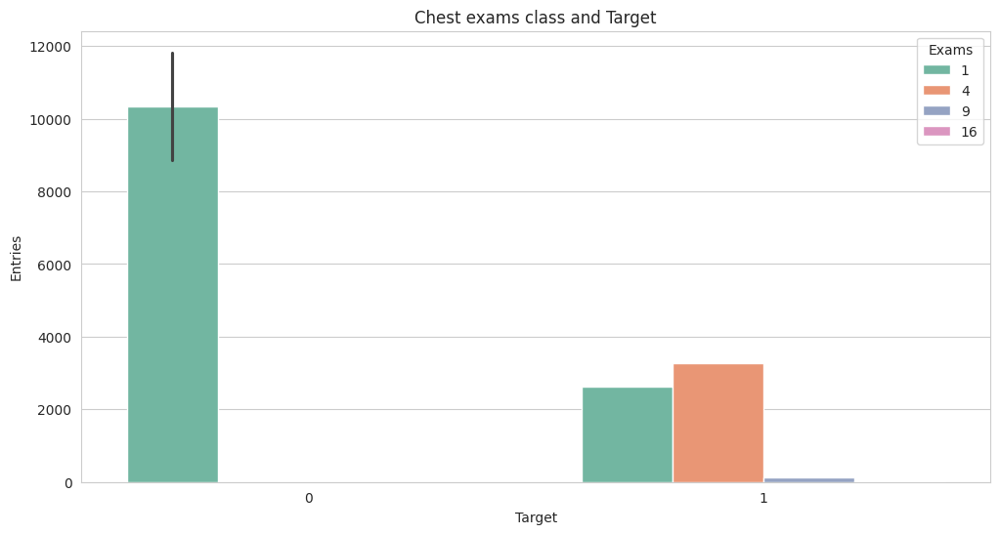

In [29]:
fig, ax = plt.subplots(nrows=1,figsize=(12,6))
sns.barplot(ax=ax,x = 'Target', y='Entries', hue='Exams',data=df2, palette='Set2')
plt.title("Chest exams class and Target")
plt.show()

In [30]:
#lets view the DICOM meta data
import pydicom as dcm
samplePatientID = list(train_df[:3].T.to_dict().values())[0]['patientId']
samplePatientID = samplePatientID+'.dcm'
dicom_file_path = os.path.join(train_images_path,samplePatientID)
dicom_file_dataset = pydicom.dcmread(dicom_file_path)
dicom_file_dataset

Dataset.file_meta -------------------------------
(0002,0000) File Meta Information Group Length  UL: 202
(0002,0001) File Meta Information Version       OB: b'\x00\x01'
(0002,0002) Media Storage SOP Class UID         UI: Secondary Capture Image Storage
(0002,0003) Media Storage SOP Instance UID      UI: 1.2.276.0.7230010.3.1.4.8323329.28530.1517874485.775526
(0002,0010) Transfer Syntax UID                 UI: JPEG Baseline (Process 1)
(0002,0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.0
(0002,0013) Implementation Version Name         SH: 'OFFIS_DCMTK_360'
-------------------------------------------------
(0008,0005) Specific Character Set              CS: 'ISO_IR 100'
(0008,0016) SOP Class UID                       UI: Secondary Capture Image Storage
(0008,0018) SOP Instance UID                    UI: 1.2.276.0.7230010.3.1.4.8323329.28530.1517874485.775526
(0008,0020) Study Date                          DA: '19010101'
(0008,0030) Study Time                  

Observations:
We can observe that we do have available some useful information in the DICOM metadata with predictive value, for example:

Patient sex;
Patient age;
Modality;
Body part examined;
View position;
Rows & Columns;
Pixel Spacing.

In [31]:
#Let's sample few images having the Target = 1.
def show_dicom_images(data):
    img_data = list(data.T.to_dict().values())
    f, ax = plt.subplots(3,3, figsize=(16,18))
    for i,data_row in enumerate(img_data):
        patientImage = data_row['patientId']+'.dcm'
        imagePath = os.path.join(directory,"stage_2_train_images/",patientImage)
        data_row_img_data = dcm.dcmread(imagePath)
        modality = data_row_img_data.Modality
        age = data_row_img_data.PatientAge
        sex = data_row_img_data.PatientSex
        data_row_img = dcm.dcmread(imagePath)
        ax[i//3, i%3].imshow(data_row_img.pixel_array, cmap=plt.cm.bone)
        ax[i//3, i%3].axis('off')
        ax[i//3, i%3].set_title('ID: {}\nModality: {} Age: {} Sex: {} Target: {}\nClass: {}\nWindow: {}:{}:{}:{}'.format(
                data_row['patientId'],
                modality, age, sex, data_row['Target'], data_row['class'],
                data_row['x'],data_row['y'],data_row['width'],data_row['height']))
    plt.show()



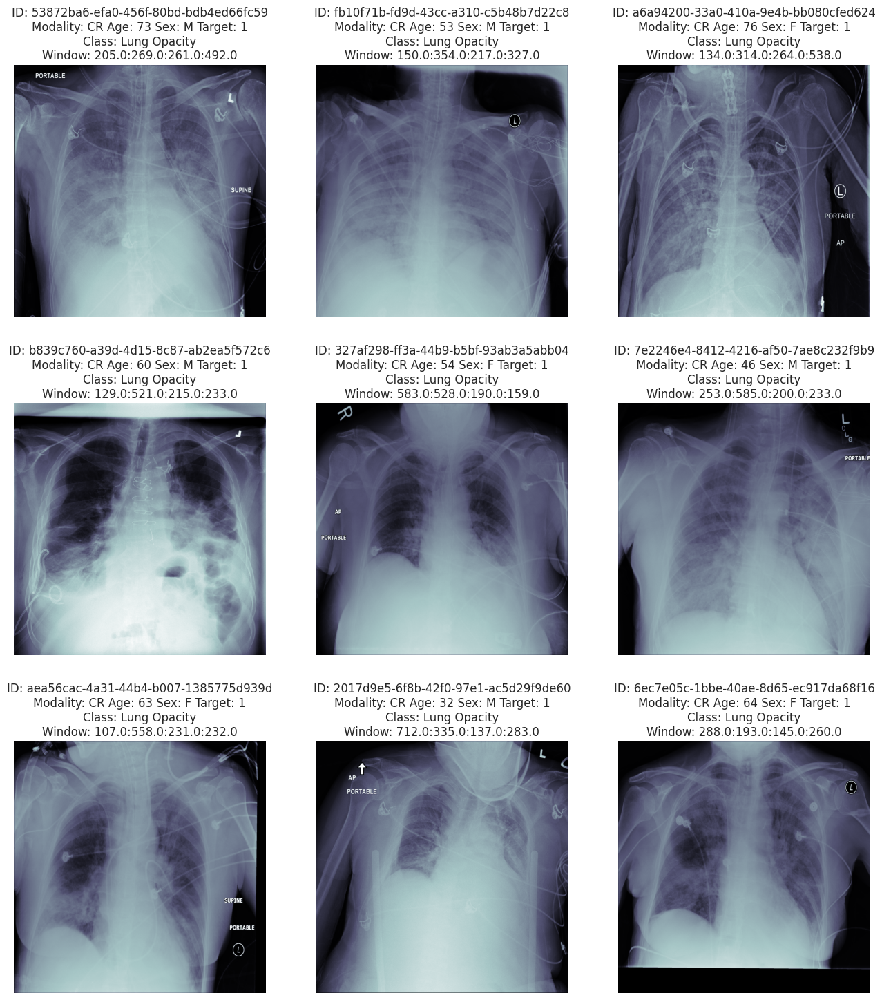

In [30]:
show_dicom_images(train_df[train_df['Target']==1].sample(9))

We would like to represent the images with the overlay boxes superposed. For this, we will need first to parse the whole dataset with Target = 1 and gather all coordinates of the windows showing a Lung Opacity on the same image.

In [32]:
def show_dicom_images_with_boxes(data):
    img_data = list(data.T.to_dict().values())
    f, ax = plt.subplots(3,3, figsize=(16,18))
    for i,data_row in enumerate(img_data):
        patientImage = data_row['patientId']+'.dcm'
        imagePath = os.path.join(directory,"stage_2_train_images/",patientImage)
        data_row_img_data = dcm.dcmread(imagePath)
        modality = data_row_img_data.Modality
        age = data_row_img_data.PatientAge
        sex = data_row_img_data.PatientSex
        data_row_img = dcm.dcmread(imagePath)
        ax[i//3, i%3].imshow(data_row_img.pixel_array, cmap=plt.cm.bone)
        ax[i//3, i%3].axis('off')
        ax[i//3, i%3].set_title('ID: {}\nModality: {} Age: {} Sex: {} Target: {}\nClass: {}'.format(
                data_row['patientId'],modality, age, sex, data_row['Target'], data_row['class']))
        rows = train_df[train_df['patientId']==data_row['patientId']]
        box_data = list(rows.T.to_dict().values())
        for j, row in enumerate(box_data):
            ax[i//3, i%3].add_patch(Rectangle(xy=(row['x'], row['y']),
                        width=row['width'],height=row['height'],
                        color="yellow",alpha = 0.1))
    plt.show()

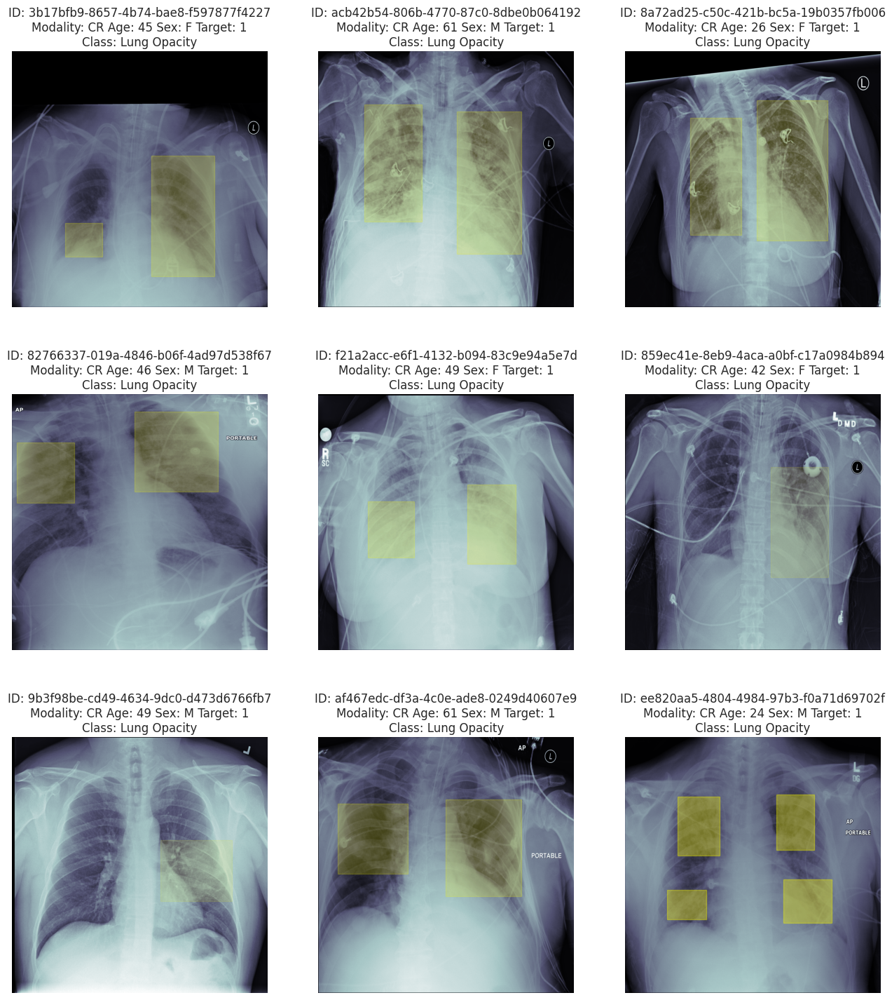

In [33]:
show_dicom_images_with_boxes(train_df[train_df['Target']==1].sample(9))

####Lets sample few images having the Target = 0.

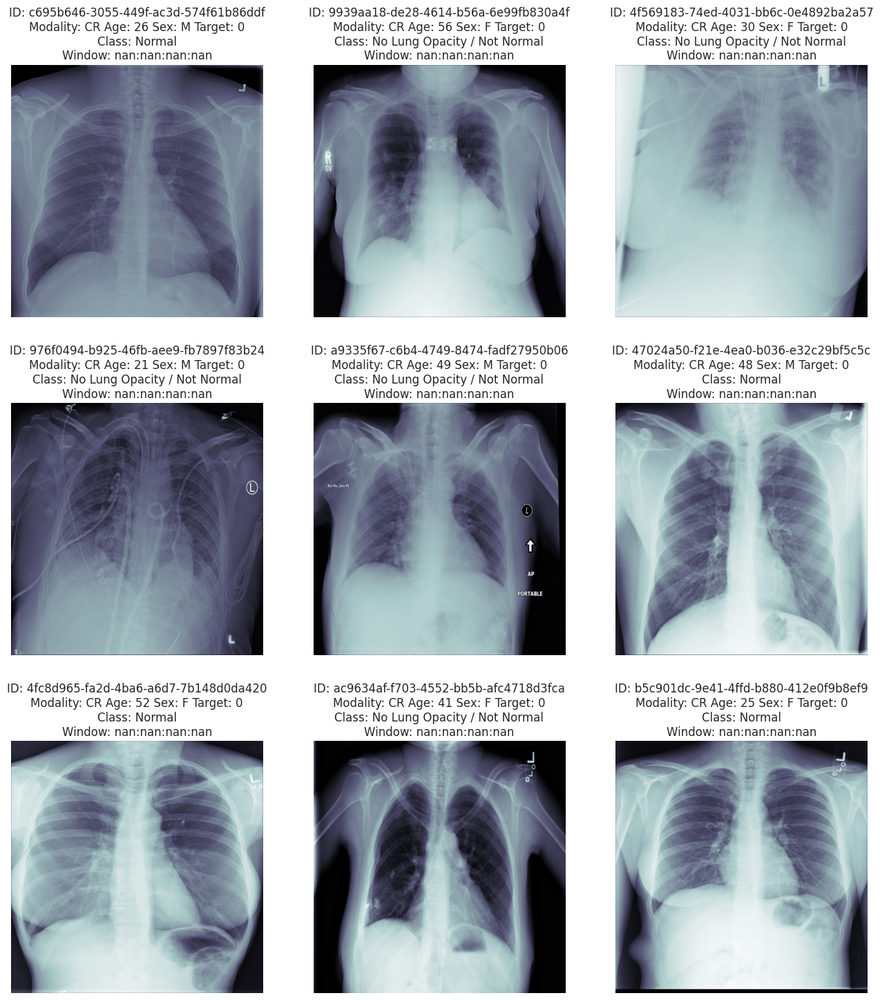

In [34]:
#Let's sample few images having the Target = 0.
show_dicom_images(train_df[train_df['Target']==0].sample(9))

# DATA MODELLING

###Data Preprocessing

In [35]:
from sklearn.model_selection import train_test_split

# Step 1: Split into train + temp (temp will be further split into val and test)
train_set, temp_set = train_test_split(train_df, test_size=0.3, random_state=42)

# Step 2: Split temp into validation and test (each 15% of original if 30% total)
validation_df, test_df = train_test_split(temp_set, test_size=0.5, random_state=42)

# Final splits:
# train_set: 70%
# val_set: 15%
# test_set: 15%


In [36]:
print("Train size: {}, Test size: {}, Validation size: {}".format(len(train_df), len(test_df),len(validation_df)))

Train size: 37629, Test size: 5645, Validation size: 5644


In [37]:
#Lets convert the .dcm files to .jpeg files and store it in a separate directory
directory1 = "/content/drive/MyDrive/Python Course/Capstone/converted_images_train"
if not os.path.exists(directory1):
    os.makedirs(directory1)
    print("Directory created successfully")
else:
    print("Directory already exists")



Directory already exists


In [38]:
import pydicom as dcm
import os

# Specify the directory containing the DICOM images
dicom_dir = '/content/drive/MyDrive/Python Course/Capstone/stage_2_train_images/'

# Get a list of all files in the directory
dicom_files = [f for f in os.listdir(dicom_dir) if f.endswith('.dcm')]

# Take a few random files
num_files_to_check = min(len(dicom_files), 5) # Check a maximum of 5 files
random_files = random.sample(dicom_files, num_files_to_check)

print(f"Checking the resolution of {num_files_to_check} random DICOM images:")

for filename in random_files:
    filepath = os.path.join(dicom_dir, filename)
    try:
        # Read the DICOM file
        dicom_data = dcm.dcmread(filepath)

        # Get the pixel array (image data)
        pixel_array = dicom_data.pixel_array

        # Get the dimensions (resolution) of the image
        height, width = pixel_array.shape[:2] # Use shape[:2] to handle grayscale or color images

        print(f"File: {filename}, Resolution: {width}x{height}")

    except Exception as e:
        print(f"Could not read file {filename}: {e}")

Checking the resolution of 5 random DICOM images:
File: e7fdbfd4-5ee2-4218-a3d2-6844bd75b84e.dcm, Resolution: 1024x1024
File: 0838fe18-1e25-4d02-8287-7692d2a5bb57.dcm, Resolution: 1024x1024
File: c4f74b32-7979-4a4f-a4fe-e3aec67855be.dcm, Resolution: 1024x1024
File: d6a9482c-0781-4595-9233-ed6da1ac5025.dcm, Resolution: 1024x1024
File: 86ed8bcd-55a0-4b91-8073-0cd11b77c907.dcm, Resolution: 1024x1024


In [ ]:
# ALREADY RAN THE CODE ONCE DO NOT RUN AGAIN
# Lets keep the original .dcm files in directory, make copy and convert the .dcm files from stage_2_train_images to .jpeg and store in directory1
import shutil
for filename in os.listdir(train_images_path):
    shutil.copy(os.path.join(train_images_path,filename), directory1)
    dcm_file_path = os
    dcm_file = pydicom.dcmread(os.path.join(directory1,filename))
    img = dcm_file.pixel_array
    img = cv2.resize(img, (224, 224))
    cv2.imwrite(os.path.join(directory1,filename.replace('.dcm', '.jpeg')), img)
    os.remove(os.path.join(directory1,filename))
    print("Converted {} to jpeg".format(filename))






Streaming output truncated to the last 5000 lines.
Converted 908a9eb7-dc6d-4113-ba9a-28a50140563f.dcm to jpeg
Converted 9830541f-b95b-430b-bbc1-236af4c138b1.dcm to jpeg
Converted aa420409-bb01-4c33-bea2-d0b1d04f5f9e.dcm to jpeg
Converted b8c3bf25-8f13-4c19-9744-84ef64173989.dcm to jpeg
Converted b74be914-6855-4166-af07-a3adb0204f35.dcm to jpeg
Converted b97cc203-9a13-4147-b7c4-7300f05eecdb.dcm to jpeg
Converted bdec4043-8799-4964-88ab-8b13659f6742.dcm to jpeg
Converted d03b693d-8e4d-48ee-8cb3-8577680a55e4.dcm to jpeg
Converted f6e624f8-75fd-4f03-9119-24a617008e2b.dcm to jpeg
Converted f73e8ce7-ed4c-42b2-9110-700e3c5f9887.dcm to jpeg
Converted 4c084eeb-9714-4b3f-86bb-0b7f0fba26c0.dcm to jpeg
Converted 4cdde362-4086-4e59-bb96-c0f38b20568c.dcm to jpeg
Converted 5da4ae85-379e-4c15-b67b-340296982a10.dcm to jpeg
Converted 7a7271a1-026f-41c6-8e42-6b0db55a4478.dcm to jpeg
Converted 9d09582f-cb29-4f48-9568-35f367b0c82e.dcm to jpeg
Converted 24a0f5b2-e762-4c07-ac23-b190fb0211ce.dcm to jpeg
Conve

In [39]:
# Lets prepare the train dataset, test dataset and validation dataset for model building
train_df['patientId'] = train_df['patientId'].apply(lambda x: x + '.jpeg')
validation_df['patientId'] = validation_df['patientId'].apply(lambda x: x + '.jpeg')
test_df['patientId'] = test_df['patientId'].apply(lambda x: x + '.jpeg')
train_df.head()



,patientId,x,y,width,height,Target,class
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6.jpeg,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd.jpeg,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal
2,00322d4d-1c29-4943-afc9-b6754be640eb.jpeg,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5.jpeg,NaN,NaN,NaN,NaN,0,Normal
4,00436515-870c-4b36-a041-de91049b9ab4.jpeg,264.0,152.0,213.0,379.0,1,Lung Opacity


In [40]:
# prompt: the images which correspond to train_df, validation_df and test_df have been re-shaped to 224/224. The x,y,width,height of the bounding boxes also need to be adjusted accordingly

def adjust_bounding_boxes(df, original_size=(1024, 1024), new_size=(224, 224)):
    """
    Adjusts bounding box coordinates based on image resizing.

    Args:
        df (pd.DataFrame): DataFrame containing 'x', 'y', 'width', 'height' columns
                           and 'Target' column.
        original_size (tuple): The original size of the images (width, height).
        new_size (tuple): The new size of the images (width, height).

    Returns:
        pd.DataFrame: DataFrame with adjusted bounding box coordinates.
    """
    # Calculate scaling factors
    x_scale = new_size[0] / original_size[0]
    y_scale = new_size[1] / original_size[1]

    # Only adjust bounding boxes for images with Target == 1
    df_adjusted = df.copy()
    mask = df_adjusted['Target'] == 1

    df_adjusted.loc[mask, 'x'] = df_adjusted.loc[mask, 'x'] * x_scale
    df_adjusted.loc[mask, 'y'] = df_adjusted.loc[mask, 'y'] * y_scale
    df_adjusted.loc[mask, 'width'] = df_adjusted.loc[mask, 'width'] * x_scale
    df_adjusted.loc[mask, 'height'] = df_adjusted.loc[mask, 'height'] * y_scale

    return df_adjusted

# Adjust bounding boxes for each DataFrame
train_df_adjusted = adjust_bounding_boxes(train_df)
validation_df_adjusted = adjust_bounding_boxes(validation_df)
test_df_adjusted = adjust_bounding_boxes(test_df)

print("Adjusted train_df sample:")
print(train_df_adjusted[train_df_adjusted['Target'] == 1].head())

print("\nAdjusted validation_df sample:")
print(validation_df_adjusted[validation_df_adjusted['Target'] == 1].head())

print("\nAdjusted test_df sample:")
print(test_df_adjusted[test_df_adjusted['Target'] == 1].head())



Adjusted train_df sample:
                                    patientId          x          y     width  \
4   00436515-870c-4b36-a041-de91049b9ab4.jpeg   57.75000   33.25000  46.59375   
5   00436515-870c-4b36-a041-de91049b9ab4.jpeg   57.75000   33.25000  46.59375   
6   00436515-870c-4b36-a041-de91049b9ab4.jpeg  122.93750   33.25000  56.00000   
7   00436515-870c-4b36-a041-de91049b9ab4.jpeg  122.93750   33.25000  56.00000   
10  00704310-78a8-4b38-8475-49f4573b2dbb.jpeg   70.65625  126.21875  35.00000   

      height  Target         class  
4   82.90625       1  Lung Opacity  
5   82.90625       1  Lung Opacity  
6   99.09375       1  Lung Opacity  
7   99.09375       1  Lung Opacity  
10  22.75000       1  Lung Opacity  

Adjusted validation_df sample:
                                       patientId          x         y  \
6690   40b011e6-7d68-482e-b8b0-664a61ebe21d.jpeg   36.53125  55.56250   
5893   3d1a1f04-fc3b-4635-b1e5-1c7ab62f20e6.jpeg  112.43750  34.12500   
25458  b99ae61

In [ ]:
import cv2
import numpy as np
import os
import glob
import shutil

#directory1 = "/content/drive/MyDrive/Python Course/Capstone/converted_images_train" # Source directory
directory2 = "/content/drive/MyDrive/Python Course/Capstone/normalized_images" # Destination directory

if not os.path.exists(directory2):
    os.makedirs(directory2)
    print("Destination directory created successfully")
else:
    print("Destination directory already exists")

def normalize_image_and_save(image_path, output_dir):
    """Normalizes a single image and saves it to the output directory."""
    img = cv2.imread(image_path)
    if img is None:
        print(f"Warning: Could not read image {image_path}")
        return

    # Convert to float32 for normalization
    img = img.astype(np.float32)
    # Normalize pixel values to be between 0 and 1
    img = img / 255.0

    # Construct the output path
    filename = os.path.basename(image_path)
    output_path = os.path.join(output_dir, filename)

    # Convert back to uint8 for saving (if saving as JPEG)
    # If you plan to use the normalized images directly in a model,
    # you might not need to save them as uint8.
    # For saving as a standard image format like JPEG, you need to convert back.
    img_to_save = (img * 255).astype(np.uint8)

    cv2.imwrite(output_path, img_to_save)
    print(f"Normalized and saved {filename} to {output_path}")


# Get a list of all jpeg files in directory1
image_files = glob.glob(os.path.join(directory1, '*.jpeg'))

for image_file in image_files:
    normalize_image_and_save(image_file, directory2)

print(f"Finished processing and saving normalized images from {directory1} to {directory2}")
print(f"Number of normalized images saved: {len(os.listdir(directory2))}")


Streaming output truncated to the last 5000 lines.
Normalized and saved aa420409-bb01-4c33-bea2-d0b1d04f5f9e.jpeg to /content/drive/MyDrive/Python Course/Capstone/normalized_images/aa420409-bb01-4c33-bea2-d0b1d04f5f9e.jpeg
Normalized and saved b8c3bf25-8f13-4c19-9744-84ef64173989.jpeg to /content/drive/MyDrive/Python Course/Capstone/normalized_images/b8c3bf25-8f13-4c19-9744-84ef64173989.jpeg
Normalized and saved b74be914-6855-4166-af07-a3adb0204f35.jpeg to /content/drive/MyDrive/Python Course/Capstone/normalized_images/b74be914-6855-4166-af07-a3adb0204f35.jpeg
Normalized and saved b97cc203-9a13-4147-b7c4-7300f05eecdb.jpeg to /content/drive/MyDrive/Python Course/Capstone/normalized_images/b97cc203-9a13-4147-b7c4-7300f05eecdb.jpeg
Normalized and saved bdec4043-8799-4964-88ab-8b13659f6742.jpeg to /content/drive/MyDrive/Python Course/Capstone/normalized_images/bdec4043-8799-4964-88ab-8b13659f6742.jpeg
Normalized and saved d03b693d-8e4d-48ee-8cb3-8577680a55e4.jpeg to /content/drive/MyDrive/

In [41]:
# Lets check the number of files in "/content/drive/My Drive/Colab Notebooks/Capstone CV files/converted_images_train"
print("Number of files in converted_images: {}".format(len(os.listdir(os.path.abspath("/content/drive/MyDrive/Python Course/Capstone/normalized_images")))))

Number of files in converted_images: 26684


##CNN

In [42]:
model1 = Sequential()

#convolutional neural networks - CNNs
model1.add(Conv2D(32, (3,3), strides = (1, 1),activation = "relu", padding = "same", input_shape = (224, 224, 3)))
model1.add(MaxPooling2D(pool_size = (2, 2)))
model1.add(Conv2D(64, (3,3), strides = (1, 1), padding = "same", activation = "relu"))
model1.add(MaxPooling2D(pool_size = (2, 2)))
model1.add(Dropout(0.2))
model1.add(Conv2D(128, (3,3), strides = (1, 1), padding = "same", activation = "relu"))
model1.add(MaxPooling2D(pool_size = (2, 2)))
model1.add(Conv2D(256, (3,3), strides = (1, 1), padding = "same", activation = "relu"))
model1.add(MaxPooling2D(pool_size = (2, 2)))
model1.add(Dropout(0.2))
model1.add(Flatten())

#fully connected layer
model1.add(Dense(128, activation = "relu"))
model1.add(Dense(64, activation = "relu"))
model1.add(Dense(32, activation = "relu"))
model1.add(Dense(1, activation = "sigmoid"))
model1.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 50176)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     6,422,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,821,441 (26.02 MB)

 Trainable params: 6,821,441 (26.02 MB)

 Non-trainable params: 0 (0.00 B)

###Lets Complile the Model

In [43]:
model1.compile(optimizer = "rmsprop", loss = "binary_crossentropy", metrics = ["accuracy"])

###Lets Train the model

In [44]:
import numpy as np
import pandas as pd
import os
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Assuming 'patientId' column contains image file names and 'Target' column contains labels
def load_and_preprocess_images(df, image_dir):
    images = []
    labels = []
    for index, row in df.iterrows():
        image_path = os.path.join(image_dir, row['patientId'])
        try:
            # Load and preprocess the image
            img = load_img(image_path, target_size=(224, 224))
            img_array = img_to_array(img)
            images.append(img_array)
            labels.append(row['Target'])
        except Exception as e:
            print(f"Error loading image {image_path}: {e}")
            continue
    return np.array(images), np.array(labels)



In [45]:
# Load and preprocess training data
train_images, train_labels = load_and_preprocess_images(
    train_df, '/content/drive/MyDrive/Python Course/Capstone/normalized_images'
)

# Load and preprocess validation data
validation_images, validation_labels = load_and_preprocess_images(
    validation_df, '/content/drive/MyDrive/Python Course/Capstone/normalized_images'
)

In [ ]:
# Train the model using the preprocessed data
history1 = model1.fit(
    train_images, train_labels,
    validation_data=(validation_images, validation_labels),
    epochs=10, batch_size=32
)

Epoch 1/10
1176/1176 ━━━━━━━━━━━━━━━━━━━━ 570s 482ms/step - accuracy: 0.6282 - loss: 10.5277 - val_accuracy: 0.7720 - val_loss: 0.4987
Epoch 2/10
1176/1176 ━━━━━━━━━━━━━━━━━━━━ 557s 474ms/step - accuracy: 0.7643 - loss: 0.5128 - val_accuracy: 0.7734 - val_loss: 0.4866
Epoch 3/10
1176/1176 ━━━━━━━━━━━━━━━━━━━━ 553s 470ms/step - accuracy: 0.7743 - loss: 0.4949 - val_accuracy: 0.7964 - val_loss: 0.4630
Epoch 4/10
1176/1176 ━━━━━━━━━━━━━━━━━━━━ 552s 469ms/step - accuracy: 0.7856 - loss: 0.4811 - val_accuracy: 0.7764 - val_loss: 0.4688
Epoch 5/10
1176/1176 ━━━━━━━━━━━━━━━━━━━━ 554s 471ms/step - accuracy: 0.7893 - loss: 0.4654 - val_accuracy: 0.7955 - val_loss: 0.4465
Epoch 6/10
1176/1176 ━━━━━━━━━━━━━━━━━━━━ 556s 472ms/step - accuracy: 0.7979 - loss: 0.4544 - val_accuracy: 0.8177 - val_loss: 0.4163
Epoch 7/10
1176/1176 ━━━━━━━━━━━━━━━━━━━━ 558s 474ms/step - accuracy: 0.8108 - loss: 0.4300 - val_accuracy: 0.8320 - val_loss: 0.3966
Epoch 8/10
1176/1176 ━━━━━━━━━━━━━━━━━━━━ 553s 470ms/step - a

In [46]:
print(model1.summary())         # works without error
print(model1.layers[-1].output) # access last layer output (or any layer)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 50176)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     6,422,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,821,441 (26.02 MB)

 Trainable params: 6,821,441 (26.02 MB)

 Non-trainable params: 0 (0.00 B)

None
<KerasTensor shape=(None, 1), dtype=float32, sparse=False, name=keras_tensor_120>


### Visualize the performance of model1

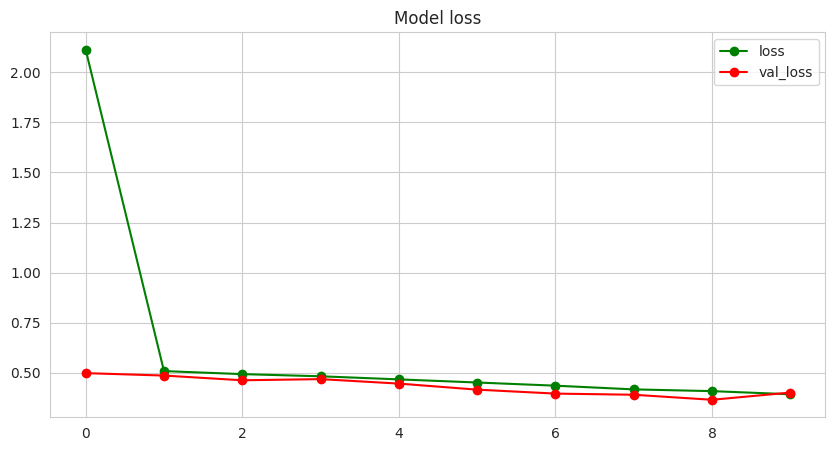

In [ ]:
plt.figure(figsize = (10, 5))
plt.title("Model loss")
plt.plot(history1.history["loss"], "go-")
plt.plot(history1.history["val_loss"], "ro-")
plt.legend(["loss", "val_loss"])
plt.show()

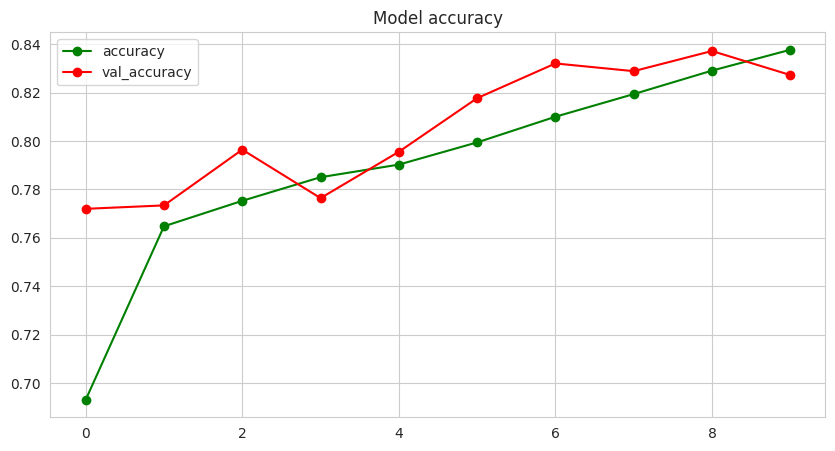

In [ ]:
plt.figure(figsize = (10, 5))
plt.title("Model accuracy")

plt.plot(history1.history["accuracy"], "go-")
plt.plot(history1.history["val_accuracy"], "ro-")
plt.legend(["accuracy", "val_accuracy"])
plt.show()

In [ ]:
predictions = model1.predict(validation_images)
print(predictions)

177/177 ━━━━━━━━━━━━━━━━━━━━ 17s 93ms/step
[[0.6421872 ]
 [0.01567348]
 [0.04956828]
 ...
 [0.48387378]
 [0.93549573]
 [0.7552814 ]]


###Evaluate model1 on the test set

In [ ]:
# Load and preprocess test data (assuming test_df is defined)
test_images, test_labels = load_and_preprocess_images(
    test_df, '/content/drive/MyDrive/Python Course/Capstone/normalized_images'
)

# Now pass the actual arrays, not the DataFrame
test_loss, test_accuracy = model1.evaluate(test_images, test_labels, batch_size=32)
print("The testing accuracy is: ", round(test_accuracy * 100, 2), "%")
print("The testing loss is: ", round(test_loss * 100, 2), "%")


177/177 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - accuracy: 0.8243 - loss: 0.4360
The testing accuracy is:  83.21 %
The testing loss is:  41.6 %


In [ ]:
import pickle

# Define the path to save the variables
save_path = os.path.join(directory, 'session_variables.pkl')

# Create a dictionary of variables to save
variables_to_save = {
    'class_info_df': class_info_df,
    'train_df': train_df,
    'test_df': test_df,
    'validation_df': validation_df,
    'train_df_adjusted': train_df_adjusted,
    'validation_df_adjusted': validation_df_adjusted,
    'test_df_adjusted': test_df_adjusted,
    'model1': model1, # Saving Keras models requires specific methods, not just pickle
    'history1': history1,
    'train_images': train_images,
    'train_labels': train_labels,
    'validation_images': validation_images,
    'validation_labels': validation_labels,
    'test_images': test_images,
    'test_labels': test_labels,
    'directory': directory,
    'directory1': directory1,
    'directory2': directory2,
    'train_images_path': train_images_path,
    # Add any other variables you want to save
}

# Save the Keras model separately
model_save_path = os.path.join(directory, 'model1.h5')
model1.save(model_save_path)
print(f"Model saved to {model_save_path}")

# Remove the model from the dictionary as it's saved separately
del variables_to_save['model1']


# Save the remaining variables using pickle
with open(save_path, 'wb') as f:
    pickle.dump(variables_to_save, f)

print(f"Variables saved to {save_path}")



Model saved to /content/drive/MyDrive/Python Course/Capstone/model1.h5
Variables saved to /content/drive/MyDrive/Python Course/Capstone/session_variables.pkl


In [ ]:
import pickle
from tensorflow.keras.models import load_model

directory = "/content/drive/MyDrive/Python Course/Capstone/"

# Define the path where variables and the model were saved
load_path = os.path.join(directory, 'session_variables.pkl')
model_load_path = os.path.join(directory, 'model1.h5')

# Load the variables
try:
    with open(load_path, 'rb') as f:
        loaded_variables = pickle.load(f)
        # Assign loaded variables
        class_info_df = loaded_variables['class_info_df']
        train_df = loaded_variables['train_df']
        test_df = loaded_variables['test_df']
        validation_df = loaded_variables['validation_df']
        train_df_adjusted = loaded_variables['train_df_adjusted']
        validation_df_adjusted = loaded_variables['validation_df_adjusted']
        test_df_adjusted = loaded_variables['test_df_adjusted']
        history1 = loaded_variables['history1']
        train_images = loaded_variables['train_images']
        train_labels = loaded_variables['train_labels']
        validation_images = loaded_variables['validation_images']
        validation_labels = loaded_variables['validation_labels']
        test_images = loaded_variables['test_images']
        test_labels = loaded_variables['test_labels']
        directory = loaded_variables['directory']
        directory1 = loaded_variables['directory1']
        directory2 = loaded_variables['directory2']
        train_images_path = loaded_variables['train_images_path']
        # Add any other variables
        print(f"Variables loaded successfully from {load_path}")
except FileNotFoundError:
    print(f"Error: Variable file not found at {load_path}")
except Exception as e:
    print(f"An error occurred while loading variables: {e}")


# Load the Keras model
try:
    model1 = load_model(model_load_path)
    print(f"Model loaded successfully from {model_load_path}")
except FileNotFoundError:
    print(f"Error: Model file not found at {model_load_path}")
except Exception as e:
    print(f"An error occurred while loading the model: {e}")



In [ ]:

# Re-run the evaluation block:
test_loss, test_accuracy = model1.evaluate(test_images, test_labels, batch_size=32)
print("The testing accuracy is: ", round(test_accuracy * 100, 2), "%")
print("The testing loss is: ", round(test_loss * 100, 2), "%")




142/142 ━━━━━━━━━━━━━━━━━━━━ 13s 85ms/step - accuracy: 0.8811 - loss: 0.3006
The testing accuracy is:  87.84 %
The testing loss is:  30.16 %


###M2Step1: Fine tune the trained basic CNN models for classification

In [ ]:
# Fine-tuning the existing CNN model (model1)
# We will retrain the existing model for a few more epochs,
# potentially with a smaller learning rate or on a slightly modified dataset
# if we were doing actual fine
# but since the task is to fine-tune without transfer learning,
# we'll just continue training the current model.

# Let's try continuing training for more epochs.
# We can use the same training and validation data.

#from tensorflow.keras.optimizers import Adam
import tensorflow as tf
# Recompile with a new optimizer
#model1.compile(optimizer=Adam(learning_rate=0.001),
#               loss='categorical_crossentropy',
#               metrics=['accuracy'])

print("Continuing to train model1 for more epochs (fine-tuning)...")

# Define a learning rate reducer callback to help stabilize training
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=3, min_lr=0.001)
tf.config.run_functions_eagerly(True)

# Continue training the model
# Start from where the previous training left off.
history_finetune = model1.fit(
    train_images, train_labels,
    validation_data=(validation_images, validation_labels),
    epochs=5,  # Train for 5 more epochs
    batch_size=32,
    callbacks=[reduce_lr] # Add the learning rate reducer callback
)

print("Fine-tuning finished.")




Continuing to train model1 for more epochs (fine-tuning)...
Epoch 1/5
1176/1176 ━━━━━━━━━━━━━━━━━━━━ 839s 713ms/step - accuracy: 0.8508 - loss: 0.3711 - val_accuracy: 0.8510 - val_loss: 0.3580 - learning_rate: 0.0010
Epoch 2/5
1176/1176 ━━━━━━━━━━━━━━━━━━━━ 834s 709ms/step - accuracy: 0.8501 - loss: 0.3707 - val_accuracy: 0.8710 - val_loss: 0.3221 - learning_rate: 0.0010
Epoch 3/5
1176/1176 ━━━━━━━━━━━━━━━━━━━━ 835s 710ms/step - accuracy: 0.8558 - loss: 0.3589 - val_accuracy: 0.8464 - val_loss: 0.3658 - learning_rate: 0.0010
Epoch 4/5
1176/1176 ━━━━━━━━━━━━━━━━━━━━ 833s 709ms/step - accuracy: 0.8700 - loss: 0.3426 - val_accuracy: 0.9033 - val_loss: 0.2630 - learning_rate: 0.0010
Epoch 5/5
1176/1176 ━━━━━━━━━━━━━━━━━━━━ 835s 710ms/step - accuracy: 0.8743 - loss: 0.3381 - val_accuracy: 0.9169 - val_loss: 0.2600 - learning_rate: 0.0010
Fine-tuning finished.


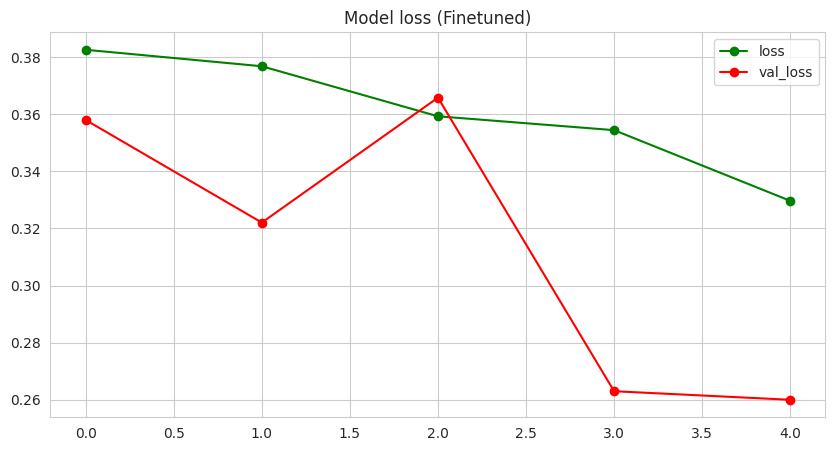

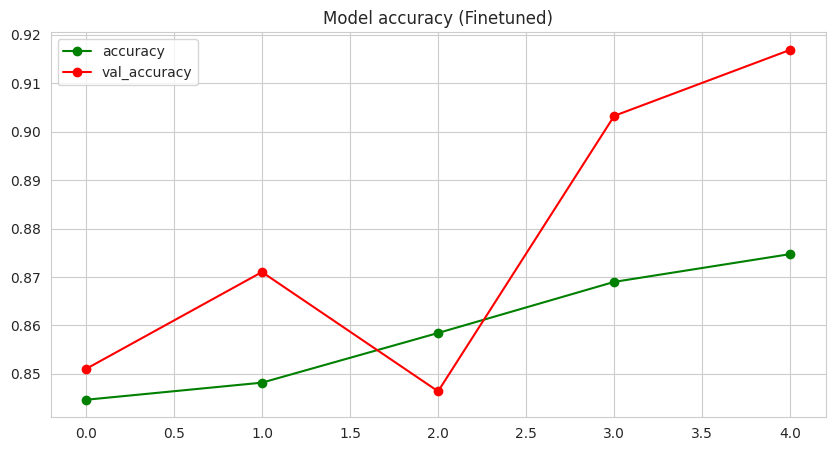

177/177 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step - accuracy: 0.9104 - loss: 0.2503


The testing accuracy after fine-tuning is:  91.64 %
The testing loss after fine-tuning is:  24.39 %
Fine-tuned model saved to /content/drive/MyDrive/Python Course/Capstone/model1_finetuned.h5


In [ ]:
# Visualize the performance of the fine-tuned model
plt.figure(figsize = (10, 5))
plt.title("Model loss (Finetuned)")
plt.plot(history_finetune.history["loss"], "go-")
plt.plot(history_finetune.history["val_loss"], "ro-")
plt.legend(["loss", "val_loss"])
plt.show()

plt.figure(figsize = (10, 5))
plt.title("Model accuracy (Finetuned)")
plt.plot(history_finetune.history["accuracy"], "go-")
plt.plot(history_finetune.history["val_accuracy"], "ro-")
plt.legend(["accuracy", "val_accuracy"])
plt.show()

# Evaluate the fine-tuned model on the test set
test_loss_finetune, test_accuracy_finetune = model1.evaluate(test_images, test_labels, batch_size=32)
print("The testing accuracy after fine-tuning is: ", round(test_accuracy_finetune * 100, 2), "%")
print("The testing loss after fine-tuning is: ", round(test_loss_finetune * 100, 2), "%")

# Save the fine-tuned model
model_finetuned_save_path = os.path.join(directory, 'model1_finetuned.h5')
model1.save(model_finetuned_save_path)
print(f"Fine-tuned model saved to {model_finetuned_save_path}")

###M2Step2:Apply Transfer Learning model for classification

In [49]:
# Fine-tuning the basic CNN model using transfer learning (VGG16)

# Load the pre-trained VGG16 model without the top classification layer
# Use weights trained on ImageNet
vgg16_base = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the base model
for layer in vgg16_base.layers:
    layer.trainable = False

# Create a new model on top of the VGG16 base
model2 = Sequential()
model2.add(vgg16_base) # Add the frozen VGG16 base
model2.add(Flatten()) # Flatten the output of the convolutional base

# Add custom dense layers for classification
model2.add(Dense(128, activation='relu'))
model2.add(Dropout(0.5)) # Add dropout for regularization
model2.add(Dense(64, activation='relu'))
model2.add(Dense(1, activation='sigmoid')) # Output layer for binary classification

# Compile the model
model2.compile(optimizer='adam', # Using Adam optimizer
               loss='binary_crossentropy',
               metrics=['accuracy'])

model2.summary()




58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │     3,211,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,934,401 (68.41 MB)

 Trainable params: 3,219,713 (12.28 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [50]:
# Define callbacks for learning rate reduction
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=3, min_lr=0.001)

In [ ]:

# Train the fine-tuned model
# Use the preprocessed train_images and train_labels, validation_images and validation_labels
history2 = model2.fit(
    train_images, train_labels,
    validation_data=(validation_images, validation_labels),
    epochs=5, batch_size=32,#Reduced epochs from 10-5
    callbacks=[reduce_lr] # Add the learning rate reduction callback
)



Epoch 1/5
1176/1176 ━━━━━━━━━━━━━━━━━━━━ 7845s 7s/step - accuracy: 0.6641 - loss: 1.3352 - val_accuracy: 0.7714 - val_loss: 0.4882 - learning_rate: 0.0010
Epoch 2/5
1176/1176 ━━━━━━━━━━━━━━━━━━━━ 7835s 7s/step - accuracy: 0.7023 - loss: 0.5665 - val_accuracy: 0.7943 - val_loss: 0.4388 - learning_rate: 0.0010
Epoch 3/5
1176/1176 ━━━━━━━━━━━━━━━━━━━━ 7837s 7s/step - accuracy: 0.7239 - loss: 0.5378 - val_accuracy: 0.7773 - val_loss: 0.4437 - learning_rate: 0.0010
Epoch 4/5
1176/1176 ━━━━━━━━━━━━━━━━━━━━ 7848s 7s/step - accuracy: 0.7155 - loss: 0.5441 - val_accuracy: 0.7998 - val_loss: 0.4485 - learning_rate: 0.0010
Epoch 5/5
1176/1176 ━━━━━━━━━━━━━━━━━━━━ 7835s 7s/step - accuracy: 0.7235 - loss: 0.5290 - val_accuracy: 0.8092 - val_loss: 0.3645 - learning_rate: 0.0010


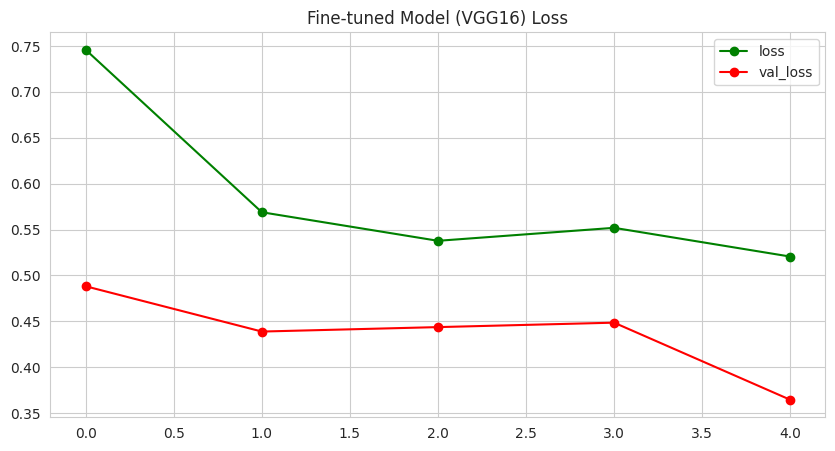

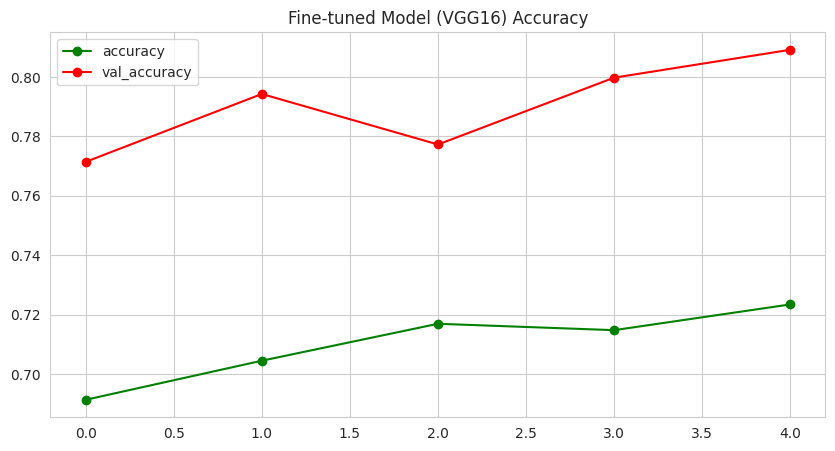

177/177 ━━━━━━━━━━━━━━━━━━━━ 85s 481ms/step - accuracy: 0.8072 - loss: 0.3599
The testing accuracy for the fine-tuned model is:  81.13 %
The testing loss for the fine-tuned model is:  36.0 %
177/177 ━━━━━━━━━━━━━━━━━━━━ 84s 472ms/step


In [ ]:

# Visualize the performance of the fine-tuned model (model2)
plt.figure(figsize=(10, 5))
plt.title("Fine-tuned Model (VGG16) Loss")
plt.plot(history2.history["loss"], "go-")
plt.plot(history2.history["val_loss"], "ro-")
plt.legend(["loss", "val_loss"])
plt.show()

plt.figure(figsize=(10, 5))
plt.title("Fine-tuned Model (VGG16) Accuracy")
plt.plot(history2.history["accuracy"], "go-")
plt.plot(history2.history["val_accuracy"], "ro-")
plt.legend(["accuracy", "val_accuracy"])
plt.show()

# Evaluate the fine-tuned model on the test set
test_loss_ft, test_accuracy_ft = model2.evaluate(test_images, test_labels, batch_size=32)
print("The testing accuracy for the fine-tuned model is: ", round(test_accuracy_ft * 100, 2), "%")
print("The testing loss for the fine-tuned model is: ", round(test_loss_ft * 100, 2), "%")

# Generate predictions for confusion matrix and classification report
predictions_ft = model2.predict(test_images)
predicted_classes_ft = (predictions_ft > 0.5).astype(int)


Confusion Matrix (Fine-tuned Model):


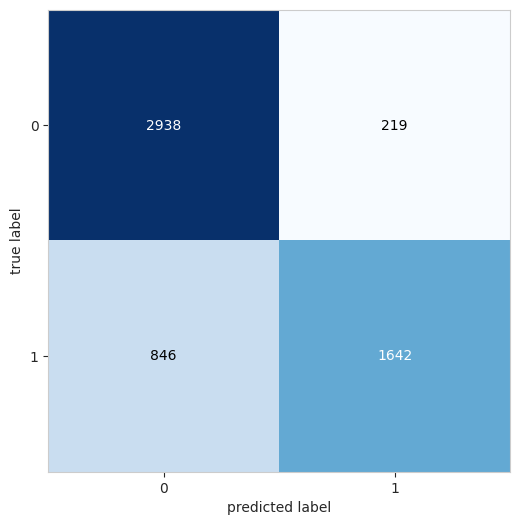

Classification Report (Fine-tuned Model):
              precision    recall  f1-score   support

           0       0.78      0.93      0.85      3157
           1       0.88      0.66      0.76      2488

    accuracy                           0.81      5645
   macro avg       0.83      0.80      0.80      5645
weighted avg       0.82      0.81      0.81      5645



In [ ]:
# Compute and print the confusion matrix
cm_ft = confusion_matrix(test_labels, predicted_classes_ft)
print("Confusion Matrix (Fine-tuned Model):")
# Correct usage: The 'plot_confusion_matrix' function from mlxtend does not have 'show_norm'.
# You might need to normalize the matrix manually or find an alternative plotting function
# or check the documentation for the correct parameter name (if it was changed in a new version).
# Assuming you want to plot the raw counts:
plot_confusion_matrix(conf_mat=cm_ft, figsize=(6, 6))
plt.show()

# If you need normalization, you would do it before plotting or use a different function.
# Example of manual normalization (optional, if needed):
# cm_ft_norm = cm_ft.astype('float') / cm_ft.sum(axis=1)[:, np.newaxis]
# plot_confusion_matrix(conf_mat=cm_ft_norm, figsize=(6, 6)) # Plotting normalized matrix
# plt.show()


# Compute and print the classification report
print("Classification Report (Fine-tuned Model):")
print(classification_report(test_labels, predicted_classes_ft))


In [ ]:


# Save the fine-tuned model
model_ft_save_path = os.path.join(directory, 'model2_vgg16_finetuned.h5')
model2.save(model_ft_save_path)
print(f"Fine-tuned model saved to {model_ft_save_path}")


Fine-tuned model saved to /content/drive/MyDrive/Python Course/Capstone/model2_vgg16_finetuned.h5


###M2Step3: Design,  train  and  test  RCNN  &  its  hybrids  based  object  detection  models  to  impose  the  bounding  box  or mask over the area of interest

In [46]:
# we will create a simplified conceptual R-CNN like model structure using Keras.
# This will involve:
# 1. A backbone CNN (we can reuse the VGG16 base).
# 2. A Region Proposal Network (RPN) or a method for generating region proposals.
#    For simplicity and without external object detection libraries, we can't implement
#    a true RPN easily. A common simplification in tutorials is to use pre-computed
#    ground truth boxes or simulated proposals for demonstration.
# 3. Region of Interest (RoI) Pooling/Alignment layer (conceptually).
# 4. Classification and Bounding Box Regression heads.

# Let's focus on the prediction part after the base model.
# We'll build upon the VGG16 base used in the previous step.


In [47]:

from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.vgg16 import VGG16
import tensorflow as tf

# Load the adjusted dataframes (assuming they are already loaded from the previous state)
# train_df_adjusted, validation_df_adjusted, test_df_adjusted

# We will only use the data with Target == 1 for bounding box regression
# since Target == 0 means no lung opacity, and thus no bounding box.
train_boxes_df = train_df_adjusted[train_df_adjusted['Target'] == 1].copy()
validation_boxes_df = validation_df_adjusted[validation_df_adjusted['Target'] == 1].copy()
test_boxes_df = test_df_adjusted[test_df_adjusted['Target'] == 1].copy()

# For simplicity, we'll treat each bounding box entry as a separate training example
# for the bounding box regression task associated with the image.
# This is a simplification; a real R-CNN processes multiple proposals per image.

# Prepare the data for bounding box regression
# The input to the bounding box regression head will be features extracted by the CNN backbone.
# The output will be the predicted bounding box coordinates (x, y, width, height).

# For demonstration purposes, let's load images corresponding to the bounding box dataframes
# and prepare their feature vectors using the VGG16 base.




In [48]:
def load_images_for_boxes(df, image_dir, target_size=(224, 224)):
    images = []
    boxes = []
    patient_ids = []
    for index, row in df.iterrows():
        # Construct the image path correctly, ensuring it has the '.jpeg' extension
        image_filename = row['patientId']
        # Check if the extension is already present (it should be based on previous code)
        if not image_filename.lower().endswith('.jpeg'):
            image_filename += '.jpeg' # Add extension if missing

        image_path = os.path.join(image_dir, image_filename)

        # Check if the file actually exists at the constructed path
        if not os.path.exists(image_path):
            print(f"Warning: Image file not found at {image_path}")
            continue

        try:
            img = load_img(image_path, target_size=target_size)
            img_array = img_to_array(img)
            images.append(img_array)
            # Store bounding box coordinates
            boxes.append([row['x'], row['y'], row['width'], row['height']])
            patient_ids.append(row['patientId'])
        except Exception as e:
            print(f"Error loading image {image_path}: {e}")
            continue
    return np.array(images), np.array(boxes), patient_ids

# Load image data and bounding boxes for the dataframes containing only Target == 1
# Use the directory where the normalized jpeg images are stored
normalized_images_dir = '/content/drive/MyDrive/Python Course/Capstone/normalized_images'

print("Loading training images and boxes for bounding box regression...")
train_reg_images, train_reg_boxes, train_reg_patient_ids = load_images_for_boxes(
    train_boxes_df, normalized_images_dir
)
print(f"Loaded {len(train_reg_images)} training images for regression.")

print("\nLoading validation images and boxes for bounding box regression...")
validation_reg_images, validation_reg_boxes, validation_reg_patient_ids = load_images_for_boxes(
    validation_boxes_df, normalized_images_dir
)
print(f"Loaded {len(validation_reg_images)} validation images for regression.")

print("\nLoading test images and boxes for bounding box regression...")
test_reg_images, test_reg_boxes, test_reg_patient_ids = load_images_for_boxes(
    test_boxes_df, normalized_images_dir
)
print(f"Loaded {len(test_reg_images)} test images for regression.")



Loading training images and boxes for bounding box regression...
Loaded 16957 training images for regression.

Loading validation images and boxes for bounding box regression...
Loaded 2591 validation images for regression.

Loading test images and boxes for bounding box regression...
Loaded 2488 test images for regression.


In [51]:

print("\nTraining RCNN-like model for bounding box regression...")

# Create the RCNN-like model structure again
vgg16_base_rcnn = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Keep layers frozen
for layer in vgg16_base_rcnn.layers:
    layer.trainable = False

base_output = vgg16_base_rcnn.output

x = Flatten()(base_output)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(64, activation='relu')(x)

bbox_output = Dense(4, name='bbox_output')(x)

# Create the RCNN-like model
rcnn_model = Model(inputs=vgg16_base_rcnn.input, outputs=bbox_output)

# Compile the model for bounding box regression
rcnn_model.compile(optimizer=Adam(learning_rate=0.001),
                   loss='mse') # Using Mean Squared Error for bounding box regression

print("Rebuilt and recompiled RCNN-like model.")
rcnn_model.summary()


# The previous loading step appears correct:
# train_reg_images, train_reg_boxes = load_images_for_boxes(train_boxes_df, normalized_images_dir)
# validation_reg_images, validation_reg_boxes = load_images_for_boxes(validation_boxes_df, normalized_images_dir)
# test_reg_images, test_reg_boxes = load_images_for_boxes(test_boxes_df, normalized_images_dir)




Training RCNN-like model for bounding box regression...
Rebuilt and recompiled RCNN-like model.


Model: "functional_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 128)            │     3,211,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bbox_output (Dense)             │ (None, 4)              │           260 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,934,596 (68.42 MB)

 Trainable params: 3,219,908 (12.28 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [52]:

# Re-run the fit method with the correct variable names and the rebuilt model.
history_rcnn = rcnn_model.fit(
    train_reg_images, train_reg_boxes,
    validation_data=(validation_reg_images, validation_reg_boxes),
    epochs=75, # Train for a few epochs
    batch_size=32
)

print("RCNN-like model training finished.")

Epoch 1/75
530/530 ━━━━━━━━━━━━━━━━━━━━ 327s 613ms/step - loss: 1657.7644 - val_loss: 1905.9574
Epoch 2/75
530/530 ━━━━━━━━━━━━━━━━━━━━ 327s 616ms/step - loss: 1098.7104 - val_loss: 2121.5852
Epoch 3/75
530/530 ━━━━━━━━━━━━━━━━━━━━ 325s 613ms/step - loss: 987.5366 - val_loss: 2111.6350
Epoch 4/75
530/530 ━━━━━━━━━━━━━━━━━━━━ 331s 625ms/step - loss: 913.5823 - val_loss: 2019.4298
Epoch 5/75
530/530 ━━━━━━━━━━━━━━━━━━━━ 330s 622ms/step - loss: 880.3292 - val_loss: 2189.3193
Epoch 6/75
530/530 ━━━━━━━━━━━━━━━━━━━━ 328s 619ms/step - loss: 859.6081 - val_loss: 2114.6633
Epoch 7/75
530/530 ━━━━━━━━━━━━━━━━━━━━ 331s 625ms/step - loss: 833.7783 - val_loss: 2046.2900
Epoch 8/75
530/530 ━━━━━━━━━━━━━━━━━━━━ 337s 636ms/step - loss: 815.3212 - val_loss: 1956.8630
Epoch 9/75
530/530 ━━━━━━━━━━━━━━━━━━━━ 333s 628ms/step - loss: 804.7822 - val_loss: 1687.7156
Epoch 10/75
530/530 ━━━━━━━━━━━━━━━━━━━━ 328s 619ms/step - loss: 784.3583 - val_loss: 1952.2036
Epoch 11/75
530/530 ━━━━━━━━━━━━━━━━━━━━ 328s 6

In [53]:
# Evaluate the RCNN-like model on the test set
# The evaluation metric for bounding box regression is typically MSE or IoU (Intersection over Union)
# We'll use MSE for evaluation as per the compilation.

test_loss_rcnn = rcnn_model.evaluate(test_reg_images, test_reg_boxes, batch_size=32)
print("The testing loss (MSE) for the RCNN-like model is: ", test_loss_rcnn)


78/78 ━━━━━━━━━━━━━━━━━━━━ 43s 556ms/step - loss: 1731.2528
The testing loss (MSE) for the RCNN-like model is:  1770.2298583984375



Displaying sample images with predicted (red) and true (green) bounding boxes:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


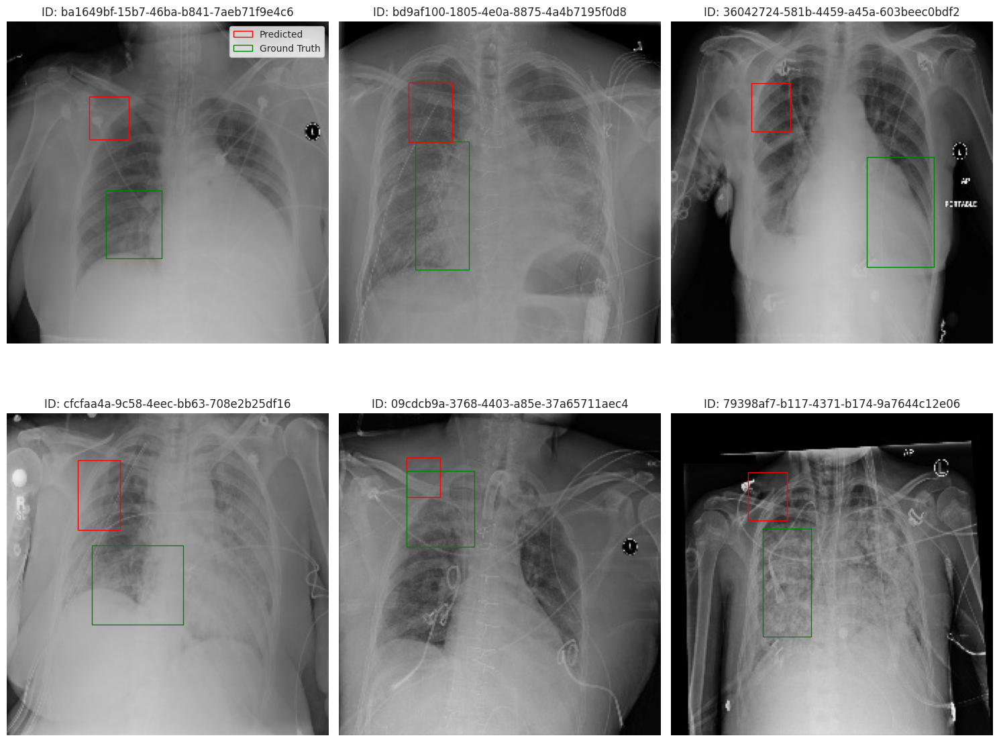

In [54]:
def predict_and_display_boxes(model, image_data, true_boxes, patient_ids, image_dir, num_samples=5):
    """
    Predicts bounding boxes for a sample of images and displays them with
    predicted and true boxes overlaid.
    """
    if len(image_data) == 0:
        print("No image data available to display boxes.")
        return

    sample_indices = random.sample(range(len(image_data)), min(num_samples, len(image_data)))

    sample_images = image_data[sample_indices]
    sample_true_boxes = true_boxes[sample_indices]
    sample_pids = [patient_ids[i] for i in sample_indices]

    # Predict bounding boxes
    predicted_boxes = model.predict(sample_images)

    plt.figure(figsize=(15, num_samples * 3))
    for i, idx in enumerate(sample_indices):
        ax = plt.subplot(num_samples // 3 + 1, 3, i + 1)

        # Load the original image to display clearly
        original_image_path = os.path.join(image_dir, sample_pids[i])

        # Ensure the file has the .jpeg extension
        if not original_image_path.lower().endswith('.jpeg'):
             original_image_path += '.jpeg'

        # Double check if the file exists before reading
        if not os.path.exists(original_image_path):
            print(f"Skipping display for missing image: {original_image_path}")
            continue

        original_img = cv2.imread(original_image_path, cv2.IMREAD_COLOR)

        # Check if the image was read successfully
        if original_img is None:
            print(f"Warning: Could not read image file for display: {original_image_path}")
            continue

        # Convert to RGB for matplotlib display
        original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

        # Ensure the image is in the correct format if it was grayscale DICOM
        if original_img.ndim == 2:
            original_img = cv2.cvtColor(original_img, cv2.COLOR_GRAY2RGB)

        ax.imshow(original_img)
        ax.axis('off')
        ax.set_title(f"ID: {os.path.splitext(sample_pids[i])[0]}")

        # Original size for display (assuming 224X224 before resizing)
        original_size = (224, 224)
        resized_size = (224, 224) # The size the model was trained on

        # Adjust the predicted boxes back to the original scale for display
        # Note: This assumes the predictions are in the resized (224, 224) scale
        # which is how we trained the model.
        x_scale = original_size[0] / resized_size[0]
        y_scale = original_size[1] / resized_size[1]

        predicted_box = predicted_boxes[i]
        pred_x, pred_y, pred_width, pred_height = predicted_box

        # Convert back to original scale for plotting
        pred_x_orig = pred_x * x_scale
        pred_y_orig = pred_y * y_scale
        pred_width_orig = pred_width * x_scale
        pred_height_orig = pred_height * y_scale

        # Draw the predicted bounding box (e.g., in red)
        rect_pred = Rectangle((pred_x_orig, pred_y_orig), pred_width_orig, pred_height_orig,
                              linewidth=1, edgecolor='r', facecolor='none', label='Predicted')
        ax.add_patch(rect_pred)

        # Draw the true bounding box (e.g., in green)
        # Note: True boxes are already in the adjusted (224, 224) scale in sample_true_boxes.
        # We need to scale them back to original size for display on the original image.
        true_box = sample_true_boxes[i]
        true_x, true_y, true_width, true_height = true_box

        true_x_orig = true_x * x_scale
        true_y_orig = true_y * y_scale
        true_width_orig = true_width * x_scale
        true_height_orig = true_height * y_scale

        rect_true = Rectangle((true_x_orig, true_y_orig), true_width_orig, true_height_orig,
                              linewidth=1, edgecolor='g', facecolor='none', label='Ground Truth')
        ax.add_patch(rect_true)

        # Add legend to the first subplot for clarity
        if i == 0:
             ax.legend(handles=[rect_pred, rect_true], loc='upper right')

    plt.tight_layout()
    plt.show()

# Display sample images with predicted and true bounding boxes
print("\nDisplaying sample images with predicted (red) and true (green) bounding boxes:")
predict_and_display_boxes(
    rcnn_model,
    test_reg_images,
    test_reg_boxes,
    test_reg_patient_ids,
    '/content/drive/MyDrive/Python Course/Capstone/normalized_images', # Use the directory with normalized images
    num_samples=6 # Display 6 sample images
)


In [55]:

#Further Fine-tuning for the RCNN model
# Try
# unfreezing some of the VGG16 base layers and fine-tuning the whole network
# with a very low learning rate.

print("\nFurther fine-tuning RCNN-like model by unfreezing some layers...")

# # Unfreeze some layers in the VGG16 base
for layer in vgg16_base_rcnn.layers[-4:]: # Unfreeze the last few convolutional blocks
     layer.trainable = True

# # Recompile the model with a very low learning rate
rcnn_model.compile(optimizer=Adam(learning_rate=0.00001), # Lower learning rate
                   loss='mse')

# Continue training
history_rcnn_finetune = rcnn_model.fit(
    train_reg_images, train_reg_boxes,
    validation_data=(validation_reg_images, validation_reg_boxes),
    epochs=25, # Train for a few more epochs
    batch_size=32
)

print("Further fine-tuning finished.")

# Evaluate the further fine-tuned model
test_loss_rcnn_finetune = rcnn_model.evaluate(test_reg_images, test_reg_boxes, batch_size=32)
print("The testing loss after further fine-tuning is: ", round(test_loss_rcnn_finetune, 4))

# Save the further fine-tuned model
rcnn_model_finetuned_save_path = os.path.join(directory, 'rcnn_model_finetuned.h5')
rcnn_model.save(rcnn_model_finetuned_save_path)
print(f"Further fine-tuned RCNN-like model saved to {rcnn_model_finetuned_save_path}")




Further fine-tuning RCNN-like model by unfreezing some layers...
Epoch 1/25
530/530 ━━━━━━━━━━━━━━━━━━━━ 476s 894ms/step - loss: 623.4444 - val_loss: 1817.7994
Epoch 2/25
530/530 ━━━━━━━━━━━━━━━━━━━━ 482s 908ms/step - loss: 617.1212 - val_loss: 1781.2950
Epoch 3/25
530/530 ━━━━━━━━━━━━━━━━━━━━ 481s 906ms/step - loss: 605.1131 - val_loss: 1665.7382
Epoch 4/25
530/530 ━━━━━━━━━━━━━━━━━━━━ 477s 899ms/step - loss: 604.9170 - val_loss: 1777.6255
Epoch 5/25
530/530 ━━━━━━━━━━━━━━━━━━━━ 479s 904ms/step - loss: 602.8157 - val_loss: 1746.8634
Epoch 6/25
530/530 ━━━━━━━━━━━━━━━━━━━━ 482s 909ms/step - loss: 595.5454 - val_loss: 1735.0565
Epoch 7/25
530/530 ━━━━━━━━━━━━━━━━━━━━ 475s 896ms/step - loss: 591.7886 - val_loss: 1692.8966
Epoch 8/25
530/530 ━━━━━━━━━━━━━━━━━━━━ 485s 915ms/step - loss: 590.4251 - val_loss: 1707.4674
Epoch 9/25
530/530 ━━━━━━━━━━━━━━━━━━━━ 477s 899ms/step - loss: 592.6313 - val_loss: 1724.3518
Epoch 10/25
530/530 ━━━━━━━━━━━━━━━━━━━━ 484s 913ms/step - loss: 583.7093 - val

The testing loss after further fine-tuning is:  1749.2372
Further fine-tuned RCNN-like model saved to /content/drive/MyDrive/Python Course/Capstone/rcnn_model_finetuned.h5



Displaying sample images with predicted (red) and true (green) bounding boxes:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


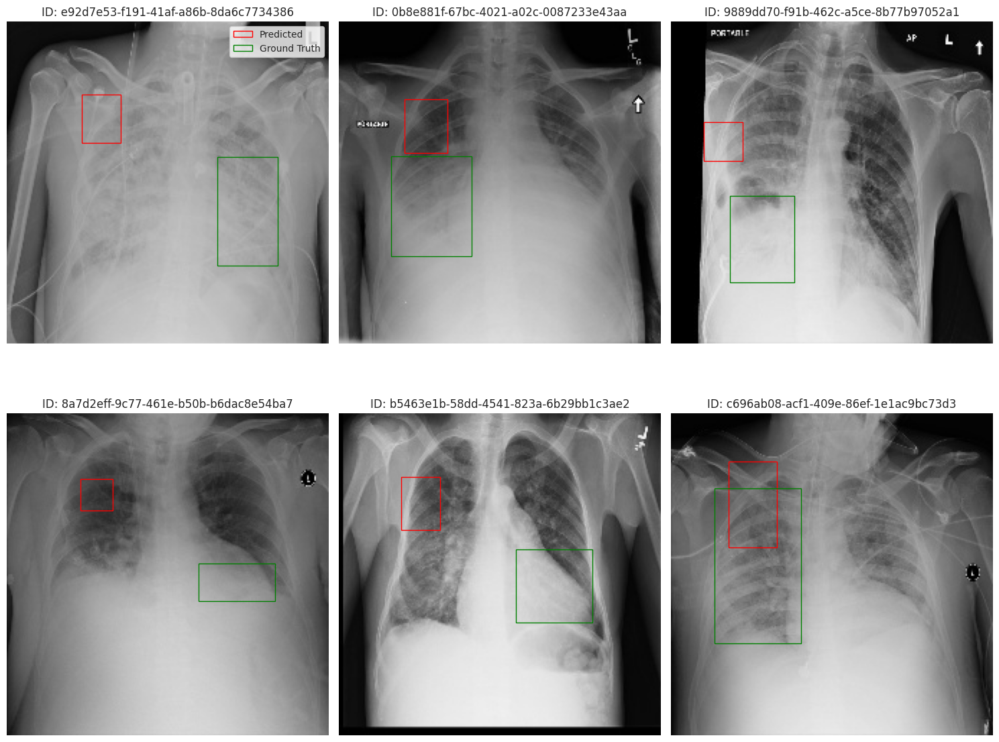

In [56]:
# Display sample images with predicted and true bounding boxes
print("\nDisplaying sample images with predicted (red) and true (green) bounding boxes:")
predict_and_display_boxes(
    rcnn_model,
    test_reg_images,
    test_reg_boxes,
    test_reg_patient_ids,
    '/content/drive/MyDrive/Python Course/Capstone/normalized_images', # Use the directory with normalized images
    num_samples=6 # Display 6 sample images
)

In [57]:

from tensorflow.keras.models import load_model

# Define the path where model2 was saved
directory = "/content/drive/MyDrive/Python Course/Capstone/"
model_ft_save_path = os.path.join(directory, 'model2_vgg16_finetuned.h5')

# Load the model
try:
  model2 = load_model(model_ft_save_path)
  print(f"Model loaded successfully from {model_ft_save_path}")
except FileNotFoundError:
  print(f"Error: Model file not found at {model_ft_save_path}")
except Exception as e:
  print(f"An error occurred while loading the model: {e}")

# You can now use model2_loaded for predictions or further evaluation
# For example, to see the summary of the loaded model:
# model2_loaded.summary()

Model loaded successfully from /content/drive/MyDrive/Python Course/Capstone/model2_vgg16_finetuned.h5


In [58]:
# Load and preprocess test data (assuming test_df is defined)
test_images, test_labels = load_and_preprocess_images(
    test_df, '/content/drive/MyDrive/Python Course/Capstone/normalized_images'
)


In [61]:

import numpy as np
import pandas as pd
import tensorflow as tf
import os
import cv2
from tensorflow.keras.models import load_model, Model
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import random
import pydicom as dcm
from matplotlib.patches import Rectangle
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# The previous code snippet provided is quite extensive, covering data loading,
# preprocessing, visualization, CNN model training, transfer learning (VGG16),
# and a conceptual R-CNN like model for bounding box regression.
# The task is to create the complete code snippet for calculating the
# average mAP value of the test data for the RCNN model.

# Mean Average Precision (mAP) is a common metric for evaluating object detection
# models. It requires comparing predicted bounding boxes against ground truth
# bounding boxes.

# To calculate mAP, we need:
# 1. The ground truth bounding boxes for the test set.
# 2. The predicted bounding boxes from our RCNN model for the test set images.
# 3. A way to match predicted boxes to ground truth boxes (e.g., using Intersection over Union - IoU).
# 4. A confidence score for each prediction.
# 5. An implementation of the mAP calculation.

# Our current RCNN-like model only outputs bounding box coordinates (4 values).
# A typical object detection model also outputs class probabilities/scores.
# Since we are doing a simplified R-CNN focusing on predicting boxes for images
# already classified as 'Lung Opacity' (Target=1), we can assume a confidence
# score of 1 for all predicted boxes on these images for this simplified mAP calculation.
# If the task was to evaluate the *entire* pipeline (classification + regression),
# we would use the classification probability from the first model (model2)
# as the confidence score for the predicted boxes from the RCNN model (rcnn_model).

# Let's calculate a simplified mAP focusing only on the regression task
# for images known to have a lung opacity.

# We'll need a library to calculate IoU and mAP. `torchmetrics` or manual
# implementation are options. Since we are in a Colab/Jupyter context and
# using TensorFlow, we can use utility functions or a simple manual implementation.
# Let's use a manual IoU calculation and a simplified mAP concept for demonstration.

# We'll calculate IoU for each predicted box vs. its corresponding ground truth box.
# Since our simplified RCNN predicts one box per input image (for Target=1 images),
# we compare the single predicted box to the single ground truth box for that image.

# We'll need to:
# 1. Get predictions from the RCNN model for the test set images that have bounding boxes.
# 2. Retrieve the corresponding ground truth boxes for these images.
# 3. Calculate IoU for each pair of predicted and ground truth boxes.
# 4. Implement a function to calculate Average Precision for the 'Lung Opacity' class
#    based on the IoU scores and assumed confidence (e.g., 1.0).
# 5. The mAP will be the AP for the single 'Lung Opacity' class.


# Assume the necessary dataframes and models are loaded or defined from previous steps.
# We need:
# - test_df_adjusted (contains ground truth bounding boxes for the test set)
# - rcnn_model (the trained RCNN-like model for bounding box regression)
# - normalized_images_dir (directory containing normalized images)

# If not already defined/loaded, ensure these are available:
# directory = "/content/drive/MyDrive/Python Course/Capstone/"
# load_path = os.path.join(directory, 'session_variables.pkl')
# rcnn_model_load_path = os.path.join(directory, 'rcnn_model_finetuned.h5') # or 'rcnn_model.h5'

# try:
#     with open(load_path, 'rb') as f:
#         loaded_variables = pickle.load(f)
#         test_df_adjusted = loaded_variables['test_df_adjusted']
# except FileNotFoundError:
#     print(f"Error: Variable file not found at {load_path}. Please run previous steps.")
#     exit() # Exit if essential variables aren't loaded
# except Exception as e:
#     print(f"An error occurred while loading variables: {e}")
#     exit()

# try:
#     rcnn_model = load_model(rcnn_model_load_path)
#     print(f"RCNN model loaded successfully from {rcnn_model_load_path}")
# except FileNotFoundError:
#     print(f"Error: RCNN model file not found at {rcnn_model_load_path}. Please train and save it.")
#     exit()
# except Exception as e:
#     print(f"An error occurred while loading the RCNN model: {e}")
#     exit()

# Assuming test_df_adjusted and rcnn_model are available from the previous context.
# We also need the test images and corresponding ground truth boxes for Target=1.

# Filter test data to include only images with bounding boxes (Target == 1)
test_boxes_df = test_df_adjusted[test_df_adjusted['Target'] == 1].copy()

# Load image data and bounding boxes for the test set (Target == 1)
# Ensure load_images_for_boxes function is available or copy it here if starting completely fresh
# For this task, we'll assume load_images_for_boxes is available from the previous context.

print("Loading test images and boxes for mAP calculation...")
normalized_images_dir = '/content/drive/MyDrive/Python Course/Capstone/normalized_images'
test_reg_images, test_reg_boxes, test_reg_patient_ids = load_images_for_boxes(
    test_boxes_df, normalized_images_dir
)
print(f"Loaded {len(test_reg_images)} test images for mAP calculation.")

# 1. Get predictions from the RCNN model
if len(test_reg_images) > 0:
    print("Generating predictions from the RCNN model...")
    predicted_boxes = rcnn_model.predict(test_reg_images)
    print("Prediction complete.")
else:
    print("No test images with bounding boxes to predict on.")
    predicted_boxes = np.array([])


# 2. The corresponding ground truth boxes are in test_reg_boxes

# 3. Implement IoU calculation
def calculate_iou(boxA, boxB):
    """
    Calculate the Intersection over Union (IoU) of two bounding boxes.
    Boxes are expected in the format [x, y, w, h].
    """
    # Convert [x, y, w, h] to [x1, y1, x2, y2]
    boxA_x1, boxA_y1, boxA_w, boxA_h = boxA
    boxB_x1, boxB_y1, boxB_w, boxB_h = boxB

    boxA_x2 = boxA_x1 + boxA_w
    boxA_y2 = boxA_y1 + boxA_h

    boxB_x2 = boxB_x1 + boxB_w
    boxB_y2 = boxB_y1 + boxB_h

    # determine the (x, y)-coordinates of the intersection rectangle
    xA = max(boxA_x1, boxB_x1)
    yA = max(boxA_y1, boxB_y1)
    xB = min(boxA_x2, boxB_x2)
    yB = min(boxB_y2, boxB_y2)

    # compute the area of intersection rectangle
    interArea = max(0, xB - xA) * max(0, yB - yA)

    # compute the area of both the prediction and ground-truth
    # rectangles
    boxAArea = boxA_w * boxA_h
    boxBArea = boxB_w * boxB_h

    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the intersection area
    iou = interArea / float(boxAArea + boxBArea - interArea)

    # return the intersection over union value
    return iou

# 4. Implement Average Precision (AP) calculation for a single class
# This is a simplified version for object detection where we have a list
# of (predicted_box, true_box) pairs and an assumed confidence (1.0).
# A proper mAP implementation involves ranking predictions by confidence,
# calculating precision and recall at different thresholds, and averaging precision
# over recall values.

# Since we predict one box per image (for Target=1), we can simplify this.
# We'll consider a prediction "correct" if its IoU with the ground truth
# is above a certain threshold (e.g., 0.5).
# Then we can calculate precision and recall.
# Precision = TP / (TP + FP)
# Recall = TP / (TP + FN)
# TP: True Positives (predicted box matches a ground truth box with IoU >= threshold)
# FP: False Positives (predicted box does not match any ground truth box above threshold)
# FN: False Negatives (ground truth box is not matched by any predicted box above threshold)

# In our simplified case (one prediction per image with Target=1, one ground truth per image):
# TP + FN = Total number of images with Target=1 in the test set
# TP + FP = Total number of predictions made (which is also the number of images with Target=1)

# So, Number of correct predictions (TP) = Number of (predicted_box, true_box) pairs
#                                          where IoU >= threshold.
# FP = 0 (since we predict exactly one box if Target=1, and assume it's intended to match the GT)
# FN = Number of images where IoU < threshold

def calculate_ap_simplified(predicted_boxes, true_boxes, iou_threshold=0.5):
    """
    Calculates a simplified Average Precision for a single class.
    Assumes one prediction per image, matched to one ground truth.
    A prediction is considered correct if IoU >= iou_threshold.
    """
    if len(predicted_boxes) != len(true_boxes) or len(predicted_boxes) == 0:
        print("Warning: Mismatch in number of predicted and true boxes or no boxes to evaluate.")
        return 0.0 # Cannot calculate AP

    true_positives = 0
    total_predictions = len(predicted_boxes) # For simplified case

    for i in range(total_predictions):
        iou = calculate_iou(predicted_boxes[i], true_boxes[i])
        if iou >= iou_threshold:
            true_positives += 1

    # In this simplified scenario (one prediction per image),
    # Total relevant items (Ground Truth) = total_predictions
    # Total retrieved items (Predictions) = total_predictions

    # Recall = TP / Total Ground Truth = true_positives / total_predictions
    # Precision = TP / Total Predictions = true_positives / total_predictions

    # AP in this simplified case is simply the ratio of correct predictions.
    average_precision = true_positives / total_predictions if total_predictions > 0 else 0.0

    return average_precision

# Calculate mAP (which is AP for the single 'Lung Opacity' class here)
# We can calculate AP at a common threshold like IoU=0.5.
# For reporting mAP, it's often done at multiple thresholds (e.g., mAP@0.5, mAP@0.75, mAP@[.5:.05:.95])

iou_threshold_for_map = 0.5
average_precision_at_0_5 = calculate_ap_simplified(predicted_boxes, test_reg_boxes, iou_threshold=iou_threshold_for_map)

print(f"\nAverage Precision (AP) at IoU={iou_threshold_for_map}: {average_precision_at_0_5:.4f}")

# mAP is typically the mean of APs over multiple classes.
# Since we only have one class with bounding boxes ('Lung Opacity'),
# the mAP is simply the AP for this class.

print(f"Mean Average Precision (mAP) of the test data for the RCNN model (at IoU={iou_threshold_for_map}): {average_precision_at_0_5:.4f}")


# Optional: Calculate AP at different IoU thresholds for more insight
iou_thresholds = [0.5, 0.6, 0.7, 0.8, 0.9]
print("\nAverage Precision (AP) at different IoU thresholds:")
for threshold in iou_thresholds:
    ap_at_threshold = calculate_ap_simplified(predicted_boxes, test_reg_boxes, iou_threshold=threshold)
    print(f"AP at IoU={threshold:.2f}: {ap_at_threshold:.4f}")


Loading test images and boxes for mAP calculation...
Loaded 2488 test images for mAP calculation.
Generating predictions from the RCNN model...
78/78 ━━━━━━━━━━━━━━━━━━━━ 42s 542ms/step
Prediction complete.

Average Precision (AP) at IoU=0.5: 0.3368
Mean Average Precision (mAP) of the test data for the RCNN model (at IoU=0.5): 0.3368

Average Precision (AP) at different IoU thresholds:
AP at IoU=0.50: 0.3368
AP at IoU=0.60: 0.2854
AP at IoU=0.70: 0.1998
AP at IoU=0.80: 0.1278
AP at IoU=0.90: 0.0699


###M2Step4:Pickle the model for future prediction

In [60]:
# prompt: pickle the rcnn model for future prediction

import pickle

# Save the RCNN-like model for future prediction
rcnn_model_save_path = os.path.join(directory, 'rcnn_model.h5')
rcnn_model.save(rcnn_model_save_path)
print(f"RCNN model saved to {rcnn_model_save_path}")


# For this simplified R-CNN, the model itself is sufficient for prediction.

# You can also save the history of the RCNN model training if needed
rcnn_history_save_path = os.path.join(directory, 'rcnn_history.pkl')
with open(rcnn_history_save_path, 'wb') as f:
    pickle.dump(history_rcnn.history, f)
print(f"RCNN training history saved to {rcnn_history_save_path}")

# Example of loading the RCNN model later for prediction:
# from tensorflow.keras.models import load_model
# loaded_rcnn_model = load_model(rcnn_model_save_path)
# Make predictions: loaded_rcnn_model.predict(new_image_data)

RCNN model saved to /content/drive/MyDrive/Python Course/Capstone/rcnn_model.h5
RCNN training history saved to /content/drive/MyDrive/Python Course/Capstone/rcnn_history.pkl
